Final Project
last update: 2025-12-24

In [0]:
storage_account = "lab94290"  
container = "airbnb"

# Reading airbnb data from Parquet.

In [0]:
sas_token="sp=rle&st=2025-12-24T17:37:04Z&se=2026-02-28T01:52:04Z&spr=https&sv=2024-11-04&sr=c&sig=a0lx%2BS6PuS%2FvJ9Tbt4NKdCJHLE9d1Y1D6vpE1WKFQtk%3D"
sas_token = sas_token.lstrip('?')
spark.conf.set(f"fs.azure.account.auth.type.{storage_account}.dfs.core.windows.net", "SAS")
spark.conf.set(f"fs.azure.sas.token.provider.type.{storage_account}.dfs.core.windows.net", "org.apache.hadoop.fs.azurebfs.sas.FixedSASTokenProvider")
spark.conf.set(f"fs.azure.sas.fixed.token.{storage_account}.dfs.core.windows.net", sas_token)

In [0]:
path = f"abfss://{container}@{storage_account}.dfs.core.windows.net/airbnb_1_12_parquet"

airbnb = spark.read.parquet(path)
display(airbnb.limit(50))

name price image description category availability discount reviews ratings seller_info breadcrumbs location lat long guests pets_allowed description_items category_rating house_rules details highlights arrangement_details amenities images available_dates url final_url listing_title property_id listing_name location_details description_by_sections description_html location_details_html is_supperhost host_number_of_reviews host_rating hosts_year host_response_rate is_guest_favorite travel_details pricing_details total_price currency cancellation_policy property_number_of_reviews country postcode_map_url host_image host_details Rental unit in Broadbeach · ★4.96 · 2 bedrooms · 2 beds · 1 bath 238 https://a0.muscache.com/pictures/50ddeaed-5302-4d0c-8200-163b2cddd071.jpg Our exceptionally stylish two bedroom, one bathroom LUXURY holiday apartment is located in the ORACLE T2, right in the heart of beautiful Broadbeach! Every corner of this gorgeous apartment overflows with style, luxury and thoughtful touches. Relax on the ocean facing balcony located directly above the manicured garden terrace and take in the relaxing views and sea breezes. This property is all class and guaranteed to satisfy even the fussiest Airbnb guest!The spaceThe photos speak for themselves. They are a true, accurate and up to date representation of our immaculately presented, squeaky clean, apartment. The furnishings are practical and comfortable and the linen and bedding are soft and luxurious. The master king bedroom opens out onto the large balcony. The second bedroom is a small internal room with a comfortable high quality queen sized bed. The second bedroom does not have a window. Each bedroom has an internal sliding door which provides access to the two way bathroom. Our apartment has been styled with a relaxing holiday in mind.Guest accessPoolSpaGymSauna and steam roomBBQ and entertaining areasGardensSecure off street parking for ONE vehicleAccess to facilities is not guaranteed and may be interrupted by routine and unexpected maintenance schedules.Other things to noteThis property accommodates up to FOUR people only. Children aged two and older are included in the four people rule. No exceptions. Infants UNDER the age of two are very welcome at our place and may stay at no additional charge however we do not provide linen or bedding. Let us know if you would like the link to a local business who hires out baby equipment (travel cots, strollers, high chairs).CHECK IN Available between 3pm and 9pm.Self check in is NOT available at this property. After hours check ins are NOT available. A 3pm check in is not guaranteed and depends on cleaning schedules. CHECK IN APPOINTMENTOur lovely host welcomes you in person on arrival. The booking guest is required to make contact with us via the booking message thread prior to their arrival day to arrange a check in time. A host will not be onsite to meet you unless you have scheduled a check in time. We always do our best to fit in with your travel schedule. IMPORTANTKeys and security fobs will only be issued to the person who made the booking. ID will be required. This is not negotiable. Please read the HOUSE RULES and CANCELLATION POLICY prior to booking our place. We recommend taking out travel insurance to cover any losses which may occur if you need to cancel your booking for an unforeseen reason. NO SMOKING - smoking is NOT permitted anywhere at this complex.CHECK IN / CHECK OUT - NOT AVAILABLE* Christmas Day* New Years Day * Easter SundayEARLY CHECK IN - We will always accommodate an early check in if our place is available. CHECK OUT by 11am - Late check outs are not available and hold up our cleaning team. WHAT WE INCLUDE IN OUR STARTER PACKOur starter pack is designed to help get you started on your holiday and may not last the entire trip. If you are with us for more than two nights, you may need to re stock items at the local supermarket. Woolworths supermarket is located right next door for any additi

# EDA, Data Cleaning, and Feature Engineering

## Selecting Cities and Countries of Focus

Our pricing model relies on enriching Airbnb listings with external contextual data, specifically weather conditions and national public holidays, which vary across locations. Collecting and integrating such contextual data for all cities and countries present in the dataset would be computationally expensive and particularly unnecessary for locations with very few listings.
To ensure both computational feasibility and statistical robustness, we first analyze the geographic distribution of listings and focus on the top 20 city-country pairs with the highest number of listings. This filtering strategy allows us to focus on locations with sufficient data density to reliably estimate demand patterns, while preserving meaningful geographic diversity and limiting the scope of external data collection to a manageable subset.

In [0]:
# Extract City and Country from the Location field and add them as new columns

import re
from pyspark.sql import functions as F
from pyspark.sql.functions import (
    col, split, size, element_at, from_json,
    regexp_extract, udf
)
from pyspark.sql.types import ArrayType, StringType, DoubleType

location_parts = split(col("location"), r",\s*")

airbnb_df = (
    airbnb
    .withColumn("location_city",    element_at(location_parts, 1))
    .withColumn("location_country", element_at(location_parts, -1))
)

display(airbnb_df.select("property_id","location_city","location_country", "location").limit(50))

property_id,location_city,location_country,location
40458495,Broadbeach,Australia,"Broadbeach, Australia"
5395975,Port Welshpool,Australia,"Port Welshpool, Victoria, Australia"
53776428,Brașov,Romania,"Brașov, Județul Brașov, Romania"
17988678,Aliki,Greece,"Aliki, Greece"
17857973,Guía,Spain,"Guía, Canarias, Spain"
53932806,Rovereto,Italy,"Rovereto, Trentino-Alto Adige, Italy"
18535615,Peniscola,Spain,"Peniscola, Comunidad Valenciana, Spain"
23049623,Sallanches,France,"Sallanches, Auvergne-Rhône-Alpes, France"
14160725,Chania,Greece,"Chania, Greece"
18058823,Cienfuegos,Cuba,"Cienfuegos, Cuba"


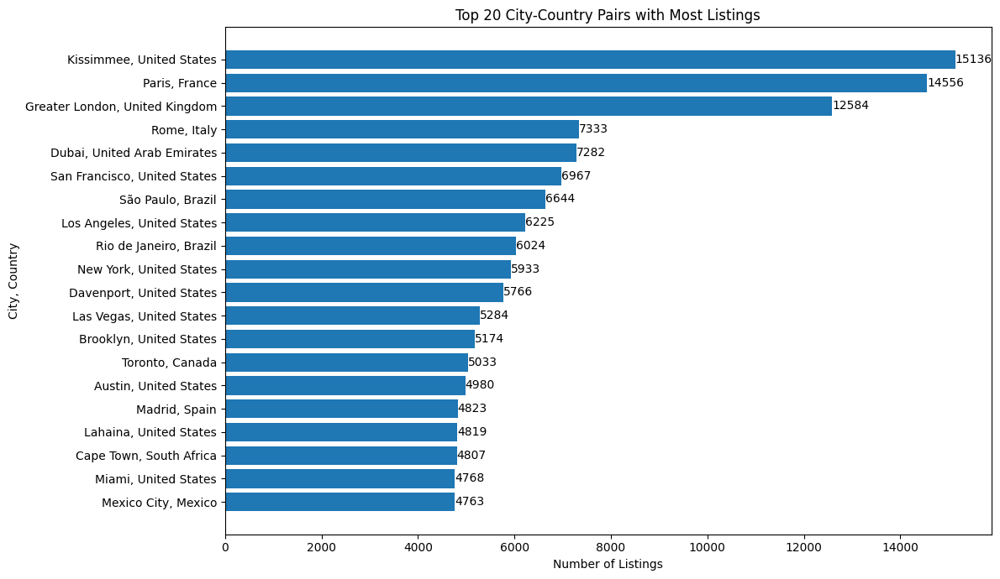

In [0]:
# Count Airbnb listings by city–country pair, selects the top 20 most frequent locations, and visualizes their listing counts

import matplotlib.pyplot as plt

# Count listings per (city, country)
city_counts = (
    airbnb_df
    .where(F.col("location_city").isNotNull() & F.col("location_country").isNotNull())
    .groupBy("location_city", "location_country")
    .count()
    .orderBy(F.desc("count"))
)

# Take top 20 and convert to Pandas
top_cities = city_counts.limit(20).toPandas()

# Create a readable label: "City, Country"
top_cities["city_country"] = (
    top_cities["location_city"] + ", " + top_cities["location_country"]
)

# Plot
plt.figure(figsize=(12, 7))
bars = plt.barh(top_cities["city_country"], top_cities["count"])
plt.gca().invert_yaxis()


# Add exact counts on bars
for bar in bars:
    width = bar.get_width()
    plt.text(
        width,                      # x position (end of bar)
        bar.get_y() + bar.get_height() / 2,
        f"{int(width)}",             # exact count
        va="center",
        ha="left",
        fontsize=10
    )

plt.title("Top 20 City-Country Pairs with Most Listings")
plt.xlabel("Number of Listings")
plt.ylabel("City, Country")
plt.tight_layout()
plt.show()

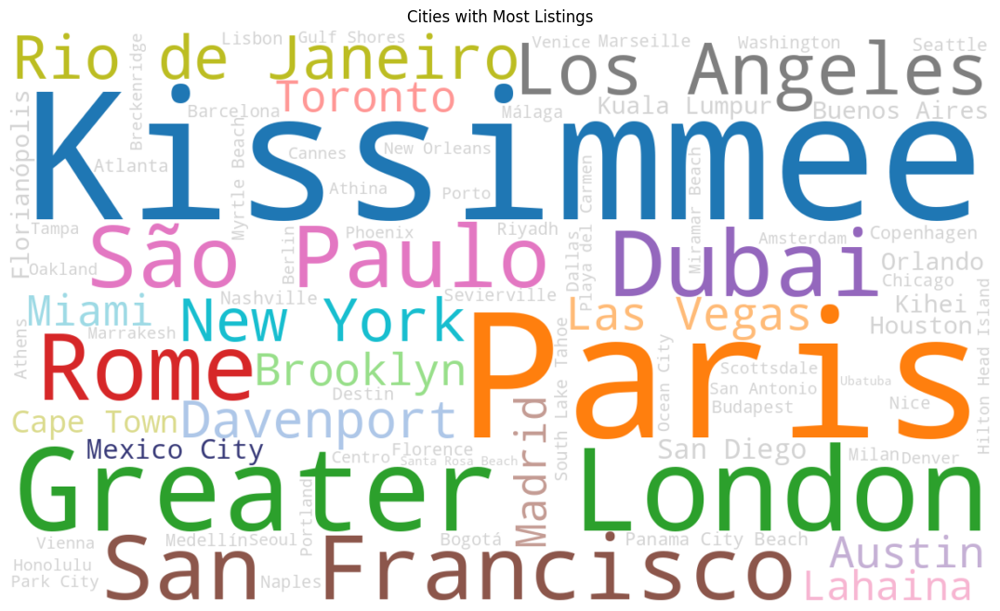

In [0]:
# Word cloud of Top-20 cities, all other cities in gray

from wordcloud import WordCloud

# Our selected Top-20 cities
selected_cities = top_cities["location_city"].tolist()

# one distinct color per selected city
palette = [
    "#1f77b4", "#ff7f0e", "#2ca02c", "#d62728", "#9467bd",
    "#8c564b", "#e377c2", "#7f7f7f", "#bcbd22", "#17becf",
    "#aec7e8", "#ffbb78", "#98df8a", "#ff9896", "#c5b0d5",
    "#c49c94", "#f7b6d2", "#dbdb8d", "#9edae5", "#393b79"
]
city_color_map = dict(zip(selected_cities, palette))

# Build frequencies (top N cities overall to show context)
topN = 80
city_counts_pd = (
    airbnb_df
    .filter(F.col("location_city").isNotNull() & (F.trim(F.col("location_city")) != ""))
    .groupBy("location_city")
    .count()
    .orderBy(F.desc("count"))
    .limit(topN)
    .toPandas()
)
freq = dict(zip(city_counts_pd["location_city"], city_counts_pd["count"]))

# Color function: selected cities get unique colors; others gray
def city_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
    return city_color_map.get(word, "#d3d3d3")  # gray for non-selected

# Plot
wc = WordCloud(
    width=1200,
    height=700,
    background_color="white",
    collocations=False
).generate_from_frequencies(freq)

plt.figure(figsize=(14, 8))
plt.imshow(wc.recolor(color_func=city_color_func), interpolation="bilinear")
plt.axis("off")
plt.title("Cities with Most Listings")
plt.show()


In [0]:
# Add a city_country column and keep only rows belonging to the top 20 city-country locations

cities_list = top_cities["city_country"].tolist() 

airbnb_df = (
    airbnb_df
    .withColumn(
        "city_country",
        F.concat_ws(", ", F.col("location_city"), F.col("location_country"))
    )
)

filtered_df = airbnb_df.filter(
    airbnb_df.city_country.isin(cities_list)
)

display(
    filtered_df.select(
        "property_id",
        "location_city",
        "location_country",
        "city_country",
        "long",
        "lat",
        "location"
    ).limit(50)
)

property_id,location_city,location_country,city_country,long,lat,location
18574545,Rome,Italy,"Rome, Italy",12.46832,41.88601,"Rome, Lazio, Italy"
612166840113311650,Greater London,United Kingdom,"Greater London, United Kingdom",0.04424,51.54682,"Greater London, England, United Kingdom"
18054959,Mexico City,Mexico,"Mexico City, Mexico",-99.16188,19.44835,"Mexico City, Mexico"
18584946,Madrid,Spain,"Madrid, Spain",-4.03737,40.65427,"Madrid, Alpedrete, Spain"
13826873,Rio de Janeiro,Brazil,"Rio de Janeiro, Brazil",-43.1842,-22.9686,"Rio de Janeiro, Brazil"
52142280,Miami,United States,"Miami, United States",-80.20131,25.83844,"Miami, Florida, United States"
1022991910909487731,Paris,France,"Paris, France",2.318368161916448,48.88802389065953,"Paris, Île-de-France, France"
1011486173934973135,Cape Town,South Africa,"Cape Town, South Africa",18.41555,-33.92095,"Cape Town, Western Cape, South Africa"
730669,Los Angeles,United States,"Los Angeles, United States",-118.36747,34.10654,"Los Angeles, California, United States"
54080258,Cape Town,South Africa,"Cape Town, South Africa",18.4971,-33.94085,"Cape Town, Western Cape, South Africa"


In [0]:
print(f"After city-country filtering, the dataset contains {filtered_df.count():,} listings.")

After city-country filtering, the dataset contains 138,901 listings.


## Price per night Standardization and Cleaning

We cleaned and standardized nightly price data - handling currencies, missing values, and outliers - in order to obtain a consistent and reliable nightly price for each listing.

In [0]:
# Parse the pricing details JSON, extract the nightly price, and add it as a numeric price_per_night column to the dataset

from pyspark.sql.functions import col, from_json, expr
from pyspark.sql.types import StructType, StructField, StringType, ArrayType

pricing_schema = StructType([
    StructField("airbnb_service_fee",      StringType(), True),
    StructField("cleaning_fee",            StringType(), True),
    StructField("initial_price_per_night", StringType(), True),
    StructField("num_of_nights",           StringType(), True),
    StructField("price_per_night",         StringType(), True),
    StructField("price_without_fees",      StringType(), True),
    StructField("special_offer",           StringType(), True),
    StructField("taxes",                   StringType(), True)
])


filtered_df = filtered_df.withColumn(
    "pricing_json",
    from_json(col("pricing_details"), pricing_schema)
).withColumn(
    "price_per_night",
    col("pricing_json.price_per_night").cast("double")
)

display(filtered_df.select("property_id","price_per_night","currency", "location_city","location_country", "location").limit(50))

property_id,price_per_night,currency,location_city,location_country,location
18574545,227.0,USD,Rome,Italy,"Rome, Lazio, Italy"
612166840113311650,677.0,USD,Greater London,United Kingdom,"Greater London, England, United Kingdom"
18054959,null,USD,Mexico City,Mexico,"Mexico City, Mexico"
18584946,102.0,USD,Madrid,Spain,"Madrid, Alpedrete, Spain"
13826873,54.0,USD,Rio de Janeiro,Brazil,"Rio de Janeiro, Brazil"
52142280,120.0,USD,Miami,United States,"Miami, Florida, United States"
1022991910909487731,null,USD,Paris,France,"Paris, Île-de-France, France"
1011486173934973135,57.0,USD,Cape Town,South Africa,"Cape Town, Western Cape, South Africa"
730669,null,USD,Los Angeles,United States,"Los Angeles, California, United States"
54080258,48.0,USD,Cape Town,South Africa,"Cape Town, Western Cape, South Africa"


In [0]:
# Identify the dominant currency used in each city and fill missing currency values accordingly to ensure consistent city-level pricing

from pyspark.sql import Window as W

# Count how many rows we have for each (city, currency)
city_curr_counts = (
   filtered_df
    .groupBy("location_city", "currency")
    .count()
    .filter(F.col("currency").isNotNull())   # ignore NULL currencies
)

# For each city, keep the currency with the largest count
w = W.partitionBy("location_city").orderBy(F.col("count").desc())

city_main_curr = (
    city_curr_counts
    .withColumn("rn", F.row_number().over(w))
    .filter(F.col("rn") == 1)
    .select("location_city", F.col("currency").alias("city_currency"))
)

# Join back to original DF
filtered_df = filtered_df.join(city_main_curr, on="location_city", how="left")

# Fill NULL currency with the city’s main currency
filtered_df = filtered_df.withColumn(
    "currency",
    F.when(F.col("currency").isNull(), F.col("city_currency"))
     .otherwise(F.col("currency"))
).drop("city_currency")

In [0]:
# Convert all nightly prices from EUR to USD using a fixed current exchange rate to ensure a unified pricing currency across the dataset

EXCHANGE_RATE_EUR_TO_USD = 1.16

filtered_df = filtered_df.withColumn(
    "price_per_night",
    F.when(F.col("currency") == "EUR",
           F.col("price_per_night") * F.lit(EXCHANGE_RATE_EUR_TO_USD))
     .otherwise(F.col("price_per_night"))
)

In [0]:
# # Treat zero nightly prices as missing values by replacing them with nulls

# filtered_df = filtered_df.withColumn(
#     "price_per_night",
#     F.when(F.col("price_per_night") == 0, None)
#      .otherwise(F.col("price_per_night"))
# )

In [0]:
from pyspark.sql import functions as F

# Treat zero nightly prices as missing
filtered_df = filtered_df.withColumn(
    "price_per_night",
    F.when(F.col("price_per_night") <= 0, None)
     .otherwise(F.col("price_per_night"))
)
print("Rows before removing null price:", filtered_df.count())

# Remove rows with missing nightly price
filtered_df = filtered_df.dropna(subset=["price_per_night"])
print("Rows after removing null price:", filtered_df.count())


Rows before removing null price: 138901
Rows after removing null price: 83563


In [0]:
# Compute approximate price quantiles to identify extreme low and high nightly-price outliers and count how many listings fall outside the selected thresholds

quantiles = filtered_df.approxQuantile("price_per_night", [0.01,0.02, 0.03, 0.04, 0.05, 0.25, 0.5, 0.75, 0.95,0.97, 0.9855,  0.99], 0.01)
print(quantiles)

q = filtered_df.approxQuantile("price_per_night", [0.02, 0.9855], 0.01)
q2, q98_55 = q[0], q[1]
print("2% quantile =", q2)
print("98.55% quantile =", q98_55)

outliers_low = filtered_df.filter(F.col("price_per_night") < q2).count()
outliers_high = filtered_df.filter(F.col("price_per_night") > q98_55).count()

print("Outliers below 2%:", outliers_low)
print("Outliers above 98.55%:", outliers_high)
print("Total outliers:", outliers_low + outliers_high)

[1.0, 16.0, 21.0, 27.47, 29.47, 87.0, 158.0, 275.0, 572.0, 685.0, 863.0, 99999.0]
2% quantile = 16.0
98.55% quantile = 863.0
Outliers below 2%: 1601
Outliers above 98.55%: 2002
Total outliers: 3603


In [0]:
# Impute missing nightly prices using the city-level median (excluding extreme values) instead of removing those listings, and then filter out remaining price outliers based on predefined quantile thresholds

median_city_price = (
    filtered_df
    .filter(
        (F.col("price_per_night").isNotNull()) &
        (F.col("price_per_night") >= q2) &
        (F.col("price_per_night") <= q98_55)
    )
    .groupBy("location_city")
    .agg(
        F.expr("percentile_approx(price_per_night, 0.5)")
         .alias("city_median_price")
    )
)

# join medians
filtered_df = filtered_df.join(median_city_price, on="location_city", how="left")

# # fill NULL prices with the city median
# filtered_df = filtered_df.withColumn(
#     "price_per_night",
#     F.when(F.col("price_per_night").isNull(), F.col("city_median_price"))
#      .otherwise(F.col("price_per_night"))
# )

print("Rows before removing price outliers:", filtered_df.count())
filtered_df = filtered_df.filter(
    (F.col("price_per_night") >= q2) &
    (F.col("price_per_night") <= q98_55)
)
print("Rows after removing price outliers:", filtered_df.count())

Rows before removing price outliers: 83563
Rows after removing price outliers: 79960


In [0]:
filtered_df = filtered_df.withColumn(
    "price_ratio",
    F.col("price_per_night") / F.col("city_median_price")
)

In [0]:
# Result: cleaned listings with nightly prices and location data
display(filtered_df.select("property_id","price_per_night","price_ratio", "city_median_price", "location_city","location_country","location").limit(50))

property_id,price_per_night,price_ratio,city_median_price,location_city,location_country,location
18584946,102.0,0.8225143133618257,124.01,Madrid,Spain,"Madrid, Alpedrete, Spain"
952424372000469284,300.0,2.4191597451818403,124.01,Madrid,Spain,"Madrid, Comunidad de Madrid, Spain"
52565330,160.75,1.2962664301266027,124.01,Madrid,Spain,"Madrid, Comunidad de Madrid, Spain"
922337579199775278,109.08,0.8796064833481171,124.01,Madrid,Spain,"Madrid, Comunidad de Madrid, Spain"
1061827730968503849,125.73,1.0138698492057092,124.01,Madrid,Spain,"Madrid, Comunidad de Madrid, Spain"
1107990452056100617,218.16,1.7592129666962342,124.01,Madrid,Spain,"Madrid, Comunidad de Madrid, Spain"
871469453403050567,220.0,1.774050479800016,124.01,Madrid,Spain,"Madrid, Comunidad de Madrid, Spain"
873047905373966603,129.0,1.0402386904281913,124.01,Madrid,Spain,"Madrid, Comunidad de Madrid, Spain"
28487493,83.0,0.6693008628336424,124.01,Madrid,Spain,"Madrid, Comunidad de Madrid, Spain"
33865179,216.0,1.7417950165309248,124.01,Madrid,Spain,"Madrid, Comunidad de Madrid, Spain"


In [0]:
# Summary statistics for the cleaned nightly price distribution
filtered_df.select("price_per_night").describe().show()

+-------+------------------+
|summary|   price_per_night|
+-------+------------------+
|  count|             79960|
|   mean|202.77320810405206|
| stddev| 156.0059499926932|
|    min|              16.0|
|    max|             863.0|
+-------+------------------+



## Shared vs. Private Property Indicator

The description_items field was parsed and transformed into a binary indicator identifying shared amenities. Since shared facilities reduce privacy and perceived quality, this feature captures an important factor that may contribute to lower property prices.

In [0]:
# Parse the property description items and create a boolean feature indicating whether the listing mentions shared amenities

filtered_df = filtered_df.withColumn(
    "description_items",
    F.from_json("description_items", "array<string>")
)

filtered_df = filtered_df.withColumn(
    "is_shared",
    F.expr("""exists(description_items, x -> lower(x) like '%shared%')""")
)

In [0]:
# Create a complementary is_private indicator from the shared-property flag

filtered_df = filtered_df.withColumn(
    "is_private",
    (~F.col("is_shared")).cast("boolean")
)

display(filtered_df.select("property_id", "is_shared","is_private", "description_items").limit(50))

property_id,is_shared,is_private,description_items
18574545,false,true,"List(Entire rental unit, 3 beds, 1 bath)"
612166840113311650,false,true,"List(Entire home, 3 beds, 2.5 baths)"
18584946,false,true,"List(Entire chalet, 10 beds, 2 baths)"
13826873,false,true,"List(Entire rental unit, 2 beds, 1 bath)"
52142280,false,true,"List(Entire guesthouse, 1 bed, 1 bath)"
1011486173934973135,false,true,"List(Entire rental unit, 1 bed, 1 bath)"
54080258,false,true,"List(Private room in home, 2 beds, 1 private bath)"
48531382,false,true,"List(Entire home, 1 bed, 1 bath)"
48362851,false,true,"List(Entire rental unit, 3 beds, 2 baths)"
54176509,false,true,"List(Entire condo, 1 bed, Half-bath)"


## Cancellation Policy of the Property

Cancellation policy is an important factor influencing booking behavior, as it reflects the level of flexibility and risk perceived by potential guests. However, the raw cancellation policy data is stored as a semi-structured JSON field, which is not directly usable by machine learning models.

To address this, we parsed the cancellation policy JSON into a structured format and transformed it into a single, interpretable categorical feature called cancellation_grade. This feature captures the degree of refund flexibility offered by each property:

2 - Full refund available

1 - Partial refund available (but no full refund)

0 - No refund, missing, or empty policy

This transformation simplifies complex policy rules into a meaningful ordinal scale that preserves the underlying business logic. In addition, aggregating policies into grades reduces noise, improves model interpretability, and enables the model to capture how cancellation flexibility impacts rental probability and pricing decisions.

In [0]:
# Parse the cancellation policy JSON and encode it as an ordinal feature.
# cancellation_grade:
# 2 - if Aany item has cancellation_name = "Full refund"
# 1 - else if any item has cancellation_name = "Partial refund"
# 0 - otherwise (including NULL, No refund only, empty array)

schema = "array<struct<cancellation_name:string,cancellation_value:string>>"

filtered_df = filtered_df.withColumn(
    "cancellation_policy",
    F.from_json("cancellation_policy", schema)
)

filtered_df = filtered_df.withColumn(
    "cancellation_grade",
    F.when(
        F.expr("exists(cancellation_policy, x -> lower(x.cancellation_name) = 'full refund')"),
        2
    ).when(
        F.expr("exists(cancellation_policy, x -> lower(x.cancellation_name) = 'partial refund')"),
        1
    ).otherwise(0)
)

In [0]:
# Display a sample of cancellation policies and their corresponding encoded grades
display(filtered_df.select("cancellation_policy", "cancellation_grade").limit(10))  

cancellation_policy,cancellation_grade
"List(List(Partial refund, 06/23/2025))",1
"List(List(No refund, 06/17/2025))",0
"List(List(No refund, 06/17/2025))",0
"List(List(Full refund, Full refund if cancel within 48 hours after booking. Get back 100% of what you paid..), List(Partial refund, 07/11/2025), List(No refund, 07/11/2025))",2
"List(List(Full refund, 05/18/2025), List(Partial refund, 05/25/2025), List(No refund, 05/25/2025))",2
"List(List(Full refund, Full refund if cancelled within 24 hours after booking. Get back 100% of what you paid..), List(Partial refund, 06/24/2025), List(No refund, 06/24/2025))",2
null,0
"List(List(No refund, 06/17/2025))",0
"List(List(Full refund, 07/02/2025), List(No refund, 07/02/2025))",2
"List(List(Full refund, 06/18/2025), List(Partial refund, 06/25/2025), List(No refund, 06/25/2025))",2


## Amenity Feature Engineering


First, we parsed the nested amenities JSON into a structured array and flattened all amenity items into a single all_amenities array. Based on this structure, we created several binary feature columns that indicate the presence of key amenities: has_wifi, has_ac_heating, has_kitchen, has_free_parking, has_laundry, has_pool_jacuzzi, has_grill, and has_gym. These engineered features transform complex textual amenity information into interpretable, model-ready indicators of important property characteristics.

In [0]:
# Parse and flatten amenities JSON into a single array for feature extraction

amenities_schema = """
array<
  struct<
    group_name:string,
    items:array<
      struct<name:string, value:string>
    >
  >
>
"""

filtered_df = filtered_df.withColumn(
    "amenities",
    F.from_json(F.col("amenities"), amenities_schema)
)

filtered_df = filtered_df.withColumn(
    "all_amenities",
    F.expr("flatten(transform(amenities, g -> g.items))")
)
# all_amenities: array<struct<name:string, value:string>>

In [0]:
# Create binary amenity features (e.g., Wi-Fi, kitchen, parking, laundry, pool, gym) from the flattened amenities list

filtered_df = (
    filtered_df

    # Wi-Fi
    .withColumn(
        "has_wifi",
        F.expr("exists(all_amenities, x -> lower(x.name) like '%wifi%' or lower(x.value) like '%wi_fi%')")
    )

    # AC or Heating
    .withColumn(
        "has_ac_heating",
        F.expr("""
            exists(all_amenities, x ->
                lower(x.name) like '%air conditioning%' OR
                lower(x.name) like '%ac%' OR
                lower(x.name) like '%heating%' OR
                lower(x.value) in ('system_snowflake','system_thermometer')
            )
        """)
    )

    # Equipped kitchen
    .withColumn(
        "has_kitchen",
        F.expr("exists(all_amenities, x -> lower(x.name) like '%kitchen%')")
    )

    # Free parking
    .withColumn(
        "has_free_parking",
        F.expr("""
            exists(all_amenities, x ->
                lower(x.name) like 'free parking%' OR
                lower(x.name) like 'free street parking%' OR
                lower(x.name) like 'free carport%' OR
                lower(x.name) like 'free parking on premises%'
            )
        """)
    )

    # Washer or dryer (laundry)
    .withColumn(
        "has_laundry",
        F.expr("""
            exists(all_amenities, x ->
                lower(x.name) like '%washer%' OR
                lower(x.name) like '%dryer%' OR
                lower(x.value) in ('system_washer','system_dryer')
            )
        """)
    )

    # Pool or jacuzzi / hot tub
    .withColumn(
        "has_pool_jacuzzi",
        F.expr("""
            exists(all_amenities, x ->
                lower(x.name) like '%pool%' OR
                lower(x.name) like '%hot tub%' OR
                lower(x.name) like '%jacuzzi%'
            )
        """)
    )

    # Grill / BBQ
    .withColumn(
        "has_grill",
        F.expr("""
            exists(all_amenities, x ->
                lower(x.name) like '%grill%' OR
                lower(x.name) like '%bbq%' OR
                lower(x.value) = 'system_grill'
            )
        """)
    )

    # Gym / fitness
    .withColumn(
        "has_gym",
        F.expr("""
            exists(all_amenities, x ->
                lower(x.name) like '%gym%' OR
                lower(x.name) like '%fitness%' OR
                lower(x.value) = 'system_gym'
            )
        """)
    )
)

In [0]:
# Display a sample of extracted amenity indicators
display(
    filtered_df.select(
        "property_id","amenities", "has_wifi","has_ac_heating","has_kitchen",
        "has_free_parking","has_laundry","has_pool_jacuzzi",
        "has_grill","has_gym"
    ).limit(20)
)

property_id,amenities,has_wifi,has_ac_heating,has_kitchen,has_free_parking,has_laundry,has_pool_jacuzzi,has_grill,has_gym
18584946,"List(List(Bathroom, List(List(Bathtub, SYSTEM_BATHTUB), List(Hair dryer, SYSTEM_HAIRDRYER), List(Cleaning products, SYSTEM_CLEANING_SUPPLIES), List(Shampoo, SYSTEM_SHAMPOO), List(Body soap, SYSTEM_SOAP), List(Bidet, SYSTEM_TOILET_BIDET), List(Outdoor shower, SYSTEM_SHOWER), List(Hot water, SYSTEM_HOT_WATER), List(Shower gel, SYSTEM_SOAP))), List(Bedroom and laundry, List(List(Free washer – In unit, SYSTEM_WASHER), List(Essentials, Towels, bed sheets, soap, and toilet paper), List(Hangers, SYSTEM_HANGERS), List(Bed linens, SYSTEM_BLANKETS), List(Extra pillows and blankets, SYSTEM_PILLOW), List(Room-darkening shades, SYSTEM_BLACKOUT_SHADES), List(Iron, SYSTEM_IRON), List(Drying rack for clothing, SYSTEM_HANGERS), List(Clothing storage: closet, SYSTEM_WARDROBE))), List(Entertainment, List(List(TV, SYSTEM_TV))), List(Family, List(List(Crib - available upon request, SYSTEM_CRIB))), List(Heating and cooling, List(List(Heating, SYSTEM_THERMOMETER))), List(Home safety, List(List(Exterior security cameras on property, A camera will be put on the entrance of the property, never inside the property in order to account for people entering.))), List(Internet and office, List(List(Wifi, SYSTEM_WI_FI))), List(Kitchen and dining, List(List(Kitchen, Space where guests can cook their own meals), List(Refrigerator, SYSTEM_REFRIGERATOR), List(Microwave, SYSTEM_MICROWAVE), List(Dishes and silverware, Bowls, chopsticks, plates, cups, etc.), List(Freezer, SYSTEM_REFRIGERATOR), List(Dishwasher, SYSTEM_DISHWASHER), List(Stove, SYSTEM_STOVE), List(Coffee maker, SYSTEM_COFFEE_MAKER), List(Toaster, SYSTEM_TOASTER), List(Blender, SYSTEM_BLENDER), List(Barbecue utensils, Grill, charcoal, bamboo skewers/iron skewers, etc.), List(Dining table, SYSTEM_DINING_TABLE))), List(Outdoor, List(List(Private patio or balcony, SYSTEM_PATIO_BALCONY), List(Private backyard, An open space on the property usually covered in grass), List(Outdoor furniture, SYSTEM_ROOFTOP_DECK), List(Hammock, SYSTEM_HAMMOCK), List(Outdoor dining area, SYSTEM_ROOFTOP_DECK), List(BBQ grill, SYSTEM_GRILL))), List(Parking and facilities, List(List(Free street parking, SYSTEM_MAPS_CAR_RENTAL), List(Private pool - , SYSTEM_POOL))), List(Services, List(List(Luggage dropoff allowed, For guests' convenience when they have early arrival or late departure), List(Long term stays allowed, Allow stay for 28 days or more), List(Self check-in, SYSTEM_KEY), List(Lockbox, SYSTEM_SAFE), List(Host greets you, SYSTEM_HOST_OWNERS))), List(Not included, List(List(Dryer, SYSTEM_NO_DRYER), List(Air conditioning, SYSTEM_NO_AIR_CONDITIONING), List(Smoke alarm, This place may not have a smoke detector. Reach out to the host with any questions.), List(Carbon monoxide alarm, This place may not have a carbon monoxide detector. Reach out to the host with any questions.))))",true,true,true,true,true,true,true,false
952424372000469284,"List(List(Bathroom, List(List(Hair dryer, SYSTEM_HAIRDRYER), List(Cleaning products, SYSTEM_CLEANING_SUPPLIES), List(Hot water, SYSTEM_HOT_WATER))), List(Bedroom and laundry, List(List(Washer, SYSTEM_WASHER), List(Free dryer – In unit, SYSTEM_DRYER), List(Essentials, Towels, bed sheets, soap, and toilet paper), List(Hangers, SYSTEM_HANGERS), List(Bed linens, Cotton linens), List(Extra pillows and blankets, SYSTEM_PILLOW), List(Room-darkening shades, SYSTEM_BLACKOUT_SHADES), List(Iron, SYSTEM_IRON), List(Drying rack for clothing, SYSTEM_HANGERS))), List(Entertainment, List(List(65-inch HDTV with Apple TV, Netflix, Hulu, Amazon Prime Video, Roku, HBO Max, Disney+, premium cable, SYSTEM_TV))), List(Heating and cooling, List(List(Air conditioning, SYSTEM_SNOWFLAKE), List(Indoor fireplace, SYSTEM_FIREPLACE), List(Central heating, SYSTEM_THERMOMETER), List(Radiant heating, SYSTEM_THERMOMETER))), List(Home safety, List(List(Fire extinguisher, SYSTEM_FIRE_EXTINGUISHER), L

In [0]:
# Compute the count and percentage of listings offering each selected amenity

amenity_cols = [
    "has_wifi", "has_ac_heating", "has_kitchen", "has_free_parking",
    "has_laundry", "has_pool_jacuzzi", "has_grill", "has_gym"
]

counts = (
    filtered_df.select([
        F.sum(F.col(c).cast("int")).alias(c + "_count") for c in amenity_cols
    ])
).toPandas().T.reset_index()

counts.columns = ["amenity", "num_listings"]
display(counts)


total_rows = filtered_df.count()

percentages = (
    filtered_df.select([
        (F.sum(F.col(c).cast("int")) / total_rows * 100).alias(c + "_pct")
        for c in amenity_cols
    ])
).toPandas().T.reset_index()

percentages.columns = ["amenity", "percentage"]
display(percentages)

amenity,num_listings
has_wifi_count,79472
has_ac_heating_count,79180
has_kitchen_count,77753
has_free_parking_count,46125
has_laundry_count,78367
has_pool_jacuzzi_count,33849
has_grill_count,19135
has_gym_count,26633


amenity,percentage
has_wifi_pct,99.38969484742371
has_ac_heating_pct,99.02451225612806
has_kitchen_pct,97.23986993496749
has_free_parking_pct,57.68509254627313
has_laundry_pct,98.00775387693847
has_pool_jacuzzi_pct,42.33241620810405
has_grill_pct,23.93071535767884
has_gym_pct,33.30790395197599


Second, we construct an amenity quality score by aggregating the binary amenity indicators using weights that are inversely proportional to each amenity's prevalence in the dataset. This approach gives greater importance to rarer, more differentiating amenities while reducing the influence of common features. The score is normalized to the [0,1] range, yielding a compact measure of overall amenity richness for use in the pricing model.

In [0]:
# Build weights
amenity_weights = {
    row["amenity"].replace("_pct", ""): 1 - row["percentage"] / 100
    for _, row in percentages.iterrows()
}

# Keep only amenities that exist in the dataframe
amenity_weights = {
    c: w for c, w in amenity_weights.items() if c in filtered_df.columns
}

# Compute raw amenity score
amenity_score_expr = sum(
    F.col(c).cast("int") * F.lit(w) for c, w in amenity_weights.items()
)

filtered_df = filtered_df.withColumn(
    "amenity_score_raw", amenity_score_expr
)

# Normalize to [0,1]
max_score = sum(amenity_weights.values())

filtered_df = filtered_df.withColumn(
    "amenity_score",
    F.col("amenity_score_raw") / F.lit(max_score)
)

In [0]:
display(
    filtered_df.select(
        ["property_id"] + list(amenity_weights.keys()) + ["amenity_score"]
    )
)

property_id,has_wifi,has_ac_heating,has_kitchen,has_free_parking,has_laundry,has_pool_jacuzzi,has_grill,has_gym,amenity_score
18574545,true,true,true,true,true,false,false,false,0.1953295241155619
612166840113311650,true,true,true,false,true,false,false,false,0.025446110279867068
18584946,true,true,true,true,true,true,true,false,0.7322484761455268
13826873,true,true,true,false,true,false,false,false,0.025446110279867068
52142280,true,true,true,true,true,false,false,true,0.46308104797003496
1011486173934973135,true,true,true,false,true,false,false,false,0.025446110279867068
54080258,true,true,true,true,true,true,false,false,0.4268499643513451
48531382,true,true,true,true,true,false,false,false,0.1953295241155619
48362851,true,true,true,true,true,false,false,false,0.1953295241155619
54176509,true,true,true,false,true,false,false,false,0.025446110279867068


In [0]:
filtered_df.select(
    "amenity_score_raw",
    "amenity_score"
).summary().show()

+-------+-------------------+--------------------+
|summary|  amenity_score_raw|       amenity_score|
+-------+-------------------+--------------------+
|  count|              79960|               79960|
|   mean| 0.9544819336256448| 0.38319982031423866|
| stddev| 0.8007765248764516|  0.3214910724175866|
|    min|                0.0|                 0.0|
|    25%|0.06338169084542278|0.025446110279867068|
|    50%|  0.730302651325663|  0.2931976341343402|
|    75%| 1.7301275637818911|  0.6946014882058182|
|    max|  2.490820410205103|                 1.0|
+-------+-------------------+--------------------+



## Selecting Dates of Focus

To ensure that the booking probability model is trained on informative and representative market conditions, we restrict the analysis to dates with sufficiently high property availability. Periods with a large number of active listings provide richer variation in prices, property characteristics, and booking outcomes, which is essential for reliably learning the relationship between price and demand. In contrast, dates with very low availability offer limited observational support and are less suitable for probabilistic modeling. Additionally, since external contextual data such as weather conditions and public holidays must be collected for each analyzed date, focusing on high-availability periods allows us to reduce the temporal scope of the study while preserving data quality.

In [0]:
# Identify and count records with null or empty property IDs
check_null_property_id = filtered_df.where(
    F.col("property_id").isNull() |
    (F.trim(F.col("property_id")) == "")
)
num_missing_id = check_null_property_id.count()
print(f"Number of records with null property_id: {num_missing_id}")

Number of records with null property_id: 0


In [0]:
print(f"We decided to remove {num_missing_id} properties that do not have a property_id.")

We decided to remove 0 properties that do not have a property_id.


In [0]:
# Filter out listings without a property_id
filtered_df = filtered_df.where(
    F.col("property_id").isNotNull() &
    (F.trim(F.col("property_id")) != "")
)

In [0]:
# Identify and quantify listings with missing or empty available_dates (i.e., properties with no available dates at all)
empty_dates_df = filtered_df.filter(
    (F.col("available_dates").isNull()) |
    (F.trim(F.col("available_dates")) == "") |
    (F.trim(F.col("available_dates")) == "[]")
)

count_empty = empty_dates_df.count()

print(f"Found {count_empty:,} rows with empty dates.")
empty_precent = round(count_empty / filtered_df.count() * 100, 2)

print(f"Percentage of records with empty dates: {empty_precent}%")

Found 15 rows with empty dates.
Percentage of records with empty dates: 0.02%


We convert the raw availability information into a daily-level representation by parsing the available dates into an array of date objects and exploding this array. This produces a table with one row per property and available date.

In [0]:
filtered_df = filtered_df.withColumn(
    "available_dates_arr",
    F.transform(
        F.from_json(F.col("available_dates"), ArrayType(StringType())),
        lambda x: F.to_date(x)
    )
)

df_daily = filtered_df.select(
    "property_id",
    F.explode("available_dates_arr").alias("date")
)

display(df_daily.limit(50)) 

property_id,date
18584946,2025-06-17
18584946,2025-06-18
18584946,2025-06-19
18584946,2025-06-22
18584946,2025-06-23
18584946,2025-06-24
18584946,2025-06-25
18584946,2025-06-26
18584946,2025-06-27
18584946,2025-06-28


We aggregate the daily availability data to count how many distinct properties are available on each date, allowing us to analyze how overall market availability varies across the calendar.

In [0]:
availability_df = df_daily.withColumn(
    "date",
    F.to_date(F.col("date"))  # if date is "YYYY-MM-DD"
)

# Count how many distinct properties are available per date
counts_per_date = (
    availability_df
    .groupBy("date")
    .agg(F.countDistinct("property_id").alias("n_available_properties"))
    .orderBy("n_available_properties")
)

display(counts_per_date.limit(50))

date,n_available_properties
2026-06-27,3
2026-06-09,3
2026-06-08,3
2026-06-23,3
2026-06-14,3
2026-06-25,3
2026-06-16,3
2026-06-19,3
2026-06-01,3
2026-06-03,3


In [0]:
display(counts_per_date.orderBy('date').limit(50))

date,n_available_properties
2024-12-01,1777
2024-12-02,1829
2024-12-03,1828
2024-12-04,1811
2024-12-05,1763
2024-12-06,1726
2024-12-07,1727
2024-12-08,1810
2024-12-09,1863
2024-12-10,1892


In [0]:
# counts_per_date.select(
#     F.min("date").alias("min_date"),
#     F.max("date").alias("max_date"),
#     F.count("*").alias("n_dates")
# ).show(truncate=False)

We explored how property availability changes over time by summarizing the number of available listings per day and examining seasonal patterns. Specifically, we computed descriptive statistics (min/median/percentiles), compared average availability across weekdays and months, and visualized the daily trend over the study period to identify recurring weekly or seasonal fluctuations.

+----------+----------+------+----------+----------+-------------+----------+----------+----------------+------------------+
|min_date  |max_date  |n_days|min_supply|p25_supply|median_supply|p75_supply|max_supply|mean_supply     |std_supply        |
+----------+----------+------+----------+----------+-------------+----------+----------+----------------+------------------+
|2024-12-01|2026-06-30|577   |3         |14442.0   |23458.0      |44541.0   |50024     |26551.7712305026|16298.135407145719|
+----------+----------+------+----------+----------+-------------+----------+----------+----------------+------------------+

+-------+------------------+
|weekday|avg_supply        |
+-------+------------------+
|1      |26461.626506024095|
|2      |26484.698795180724|
|3      |26584.09638554217 |
|4      |26871.841463414636|
|5      |26637.70731707317 |
|6      |26411.378048780487|
|7      |26412.573170731706|
+-------+------------------+



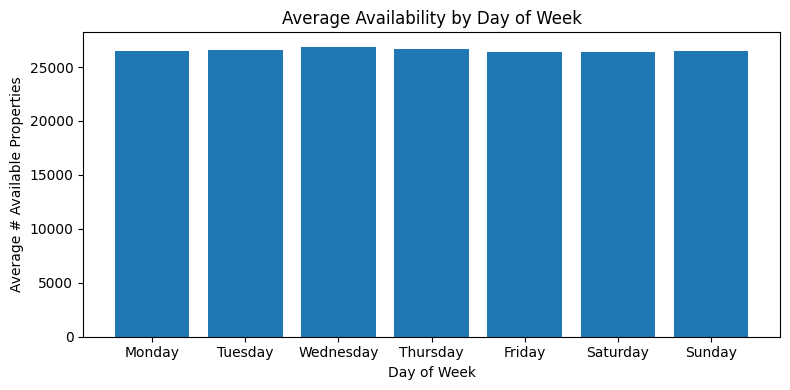

+-----+------------------+
|month|avg_supply        |
+-----+------------------+
|1    |19696.74193548387 |
|2    |21227.125         |
|3    |19526.3064516129  |
|4    |19741.65          |
|5    |19530.41935483871 |
|6    |14453.166666666666|
|7    |43638.25806451613 |
|8    |48509.967741935485|
|9    |47713.5           |
|10   |45791.06451612903 |
|11   |45755.73333333333 |
|12   |21887.967741935485|
+-----+------------------+



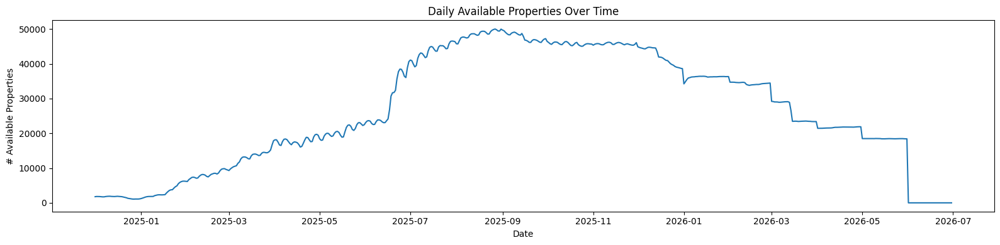

In [0]:
import seaborn as sns
import numpy as np
import pandas as pd 

# Prepare a time-enriched Spark table for EDA (weekday/month) + basic stats
counts_time = (
    counts_per_date
    .withColumn("date", F.to_date("date"))
    .withColumn("month", F.month("date"))
    .withColumn("weekday", F.dayofweek("date"))  # 1=Sunday, 7=Saturday
)

# Basic summary stats of daily availability (supply)
counts_time.select(
    F.min("date").alias("min_date"),
    F.max("date").alias("max_date"),
    F.count("*").alias("n_days"),
    F.min("n_available_properties").alias("min_supply"),
    F.expr("percentile(n_available_properties, 0.25)").alias("p25_supply"),
    F.expr("percentile(n_available_properties, 0.5)").alias("median_supply"),
    F.expr("percentile(n_available_properties, 0.75)").alias("p75_supply"),
    F.max("n_available_properties").alias("max_supply"),
    F.mean("n_available_properties").alias("mean_supply"),
    F.stddev("n_available_properties").alias("std_supply")
).show(truncate=False)

# Average availability by weekday (weekly seasonality)
counts_time.groupBy("weekday") \
    .agg(F.mean("n_available_properties").alias("avg_supply")) \
    .orderBy("weekday") \
    .show(truncate=False)


weekday_avg_df = (
    counts_time
    .groupBy("weekday")
    .agg(F.mean("n_available_properties").alias("avg_supply"))
)

weekday_pd = weekday_avg_df.toPandas()

# Spark weekday mapping: 1=Sunday ... 7=Saturday
weekday_map = {
    1: "Sunday",
    2: "Monday",
    3: "Tuesday",
    4: "Wednesday",
    5: "Thursday",
    6: "Friday",
    7: "Saturday"
}

weekday_pd["weekday_name"] = weekday_pd["weekday"].map(weekday_map)

# Order days logically (Mon → Sun)
order = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]
weekday_pd["weekday_name"] = pd.Categorical(
    weekday_pd["weekday_name"],
    categories=order,
    ordered=True
)

weekday_pd = weekday_pd.sort_values("weekday_name")

plt.figure(figsize=(8, 4))
plt.bar(
    weekday_pd["weekday_name"],
    weekday_pd["avg_supply"],
    color="#1f77b4"
)

plt.xlabel("Day of Week")
plt.ylabel("Average # Available Properties")
plt.title("Average Availability by Day of Week")

plt.tight_layout()
plt.show()


# Average availability by month (annual seasonality)
counts_time.groupBy("month") \
    .agg(F.mean("n_available_properties").alias("avg_supply")) \
    .orderBy("month") \
    .show(truncate=False)


# Convert once to Pandas for plotting
counts_pd = counts_time.select("date", "n_available_properties").orderBy("date").toPandas()


# Plots
# (A) Overview time series
# (B) 60-day window bar charts
# (C) Distribution histogram (not time-based)


# Overview: daily availability over time
plt.figure(figsize=(16, 4))
plt.plot(counts_pd["date"], counts_pd["n_available_properties"])
plt.xlabel("Date")
plt.ylabel("# Available Properties")
plt.title("Daily Available Properties Over Time")
plt.tight_layout()
plt.show()

To better visualize longer-term patterns, we converted daily availability into a weekly average and plotted it in consecutive 6-month windows. This smoothing reduces day-to-day noise and makes seasonal changes easier to see, while using the same y-axis scale across panels for fair comparison. Weeks with lower-than-typical availability are highlighted in gray (below a chosen percentile threshold), and higher-availability weeks are shown in blue.

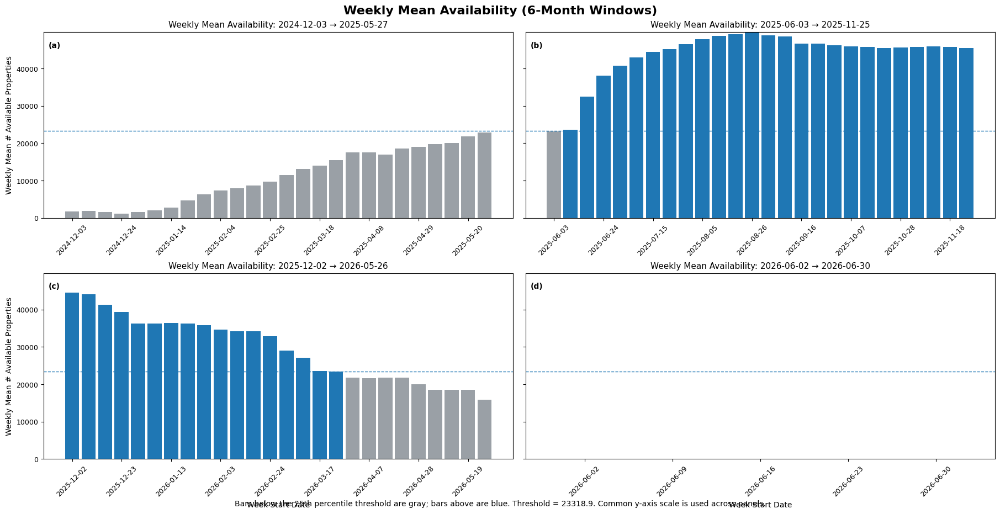

In [0]:
import math

# input: counts_pd with columns:
#   date, n_available_properties
counts_pd = counts_pd.copy()
counts_pd["date"] = pd.to_datetime(counts_pd["date"])
counts_pd["n_available_properties"] = pd.to_numeric(counts_pd["n_available_properties"], errors="coerce").fillna(0)

# Full daily calendar (fill missing days with 0)
full_dates = pd.DataFrame({
    "date": pd.date_range(counts_pd["date"].min(), counts_pd["date"].max(), freq="D")
})
counts_pd_full = (
    full_dates.merge(counts_pd, on="date", how="left")
    .fillna({"n_available_properties": 0})
    .sort_values("date")
    .reset_index(drop=True)
)

# Convert daily -> weekly mean (week starts Monday)
counts_pd_full["week_start"] = counts_pd_full["date"].dt.to_period("W-MON").apply(lambda p: p.start_time)
weekly_pd = (
    counts_pd_full.groupby("week_start", as_index=False)["n_available_properties"]
    .mean()
    .rename(columns={"n_available_properties": "weekly_mean"})
    .sort_values("week_start")
    .reset_index(drop=True)
)

# Define threshold for coloring
threshold = weekly_pd["weekly_mean"].quantile(0.5)

# Build 6-month windows over weekly timeline
window_months = 6
cols = 2                  # 2 panels per row
max_panels = None

start_date = weekly_pd["week_start"].min()
end_date = weekly_pd["week_start"].max()
boundaries = pd.date_range(start=start_date, end=end_date + pd.offsets.MonthBegin(1), freq=f"{window_months}MS")

windows = []
for w_start in boundaries:
    w_end = w_start + pd.DateOffset(months=window_months) - pd.Timedelta(days=1)
    chunk = weekly_pd[(weekly_pd["week_start"] >= w_start) & (weekly_pd["week_start"] <= w_end)]
    if len(chunk) > 0:
        windows.append(chunk)

if max_panels is not None:
    windows = windows[:max_panels]

num_panels = len(windows)
rows = math.ceil(num_panels / cols)

# Global y-scale for comparability
y_max = weekly_pd["weekly_mean"].max()

# Plot styling
plt.rcParams.update({
    "axes.titlesize": 11,
    "axes.labelsize": 10,
    "xtick.labelsize": 9,
    "ytick.labelsize": 9,
})

fig_w = 18
fig_h = 4.6 * rows
fig, axes = plt.subplots(rows, cols, figsize=(fig_w, fig_h), sharey=True, constrained_layout=True)

# Flatten axes
if rows == 1:
    axes = list(axes)
else:
    axes = [ax for row_axes in axes for ax in row_axes]

letters = "abcdefghijklmnopqrstuvwxyz"

for i, chunk in enumerate(windows):
    ax = axes[i]

    # Color bars by threshold
    colors = ["#9aa0a6" if v < threshold else "#1f77b4" for v in chunk["weekly_mean"]]

    # Bar width
    ax.bar(chunk["week_start"], chunk["weekly_mean"], width=6, color=colors)

    ax.set_ylim(0, y_max)

    ax.text(
        0.01, 0.95, f"({letters[i]})",
        transform=ax.transAxes, va="top", ha="left",
        fontweight="bold"
    )

    ax.set_title(f"Weekly Mean Availability: {chunk['week_start'].iloc[0].date()} → {chunk['week_start'].iloc[-1].date()}")

    step = max(1, len(chunk) // 8)
    tick_idx = list(range(0, len(chunk), step))
    ax.set_xticks(chunk["week_start"].iloc[tick_idx])
    ax.tick_params(axis="x", rotation=45)

    # Labels
    if i % cols == 0:
        ax.set_ylabel("Weekly Mean # Available Properties")
    if i >= (rows - 1) * cols:
        ax.set_xlabel("Week Start Date")

    # Add a horizontal threshold reference line
    ax.axhline(threshold, linewidth=1, linestyle="--")

# Hide unused axes and keep layout centered
for j in range(num_panels, len(axes)):
    axes[j].axis("off")

fig.suptitle("Weekly Mean Availability (6-Month Windows)", fontsize=16, fontweight="bold")
fig.text(
    0.5, 0.01,
    f"Bars below the 25th percentile threshold are gray; bars above are blue. "
    f"Threshold = {threshold:.1f}. Common y-axis scale is used across panels.",
    ha="center",
    fontsize=10
)

plt.show()

## Sentiment Analysis of Property Reviews



We applied sentiment analysis to the "reviews" column to capture guests' emotional impressions. By converting each hotel's reviews into positive, negative, and neutral counts and extracting a majority sentiment label, we provide the model with a compact signal that reflects overall guest satisfaction without using full review text.

Listings without reviews are assigned a neutral sentiment, reflecting the absence of expressed opinion rather than positive or negative bias.

In [0]:
from pyspark.sql.types import IntegerType, ArrayType, StringType
from pyspark.ml.linalg import Vectors, VectorUDT
import nltk
from nltk.sentiment import SentimentIntensityAnalyzer

# NLTK VADER setup
nltk.download("vader_lexicon", quiet=True)
sia = SentimentIntensityAnalyzer()

# Parse reviews JSON string -> array<string>
filtered_df = filtered_df.withColumn(
    "reviews_arr",
    F.from_json(F.col("reviews"), ArrayType(StringType()))
)

# Build sentiment vector in order: [Neg, Neu, Pos]
def analyze_reviews_vector(reviews_array):
    if not reviews_array:
        return Vectors.dense([0.0, 0.0, 0.0])

    pos = neg = neu = 0.0

    for text in reviews_array:
        if not text:
            continue
        text = text.strip()
        if not text:
            continue

        score = sia.polarity_scores(text)["compound"]
        if score >= 0.05:
            pos += 1
        elif score <= -0.05:
            neg += 1
        else:
            neu += 1

    return Vectors.dense([neg, neu, pos])

# Majority vote index: 0=Neg, 1=Neu, 2=Pos
def get_majority_vote(vector):
    if vector is None:
        return 1  # neutral by default

    counts = vector.toArray()  # [Neg, Neu, Pos]
    if float(counts.sum()) == 0.0:
        return 1  # neutral if no reviews

    return int(np.argmax(counts))

# Register UDFs
sentiment_vector_udf = F.udf(analyze_reviews_vector, VectorUDT())
majority_vote_udf = F.udf(get_majority_vote, IntegerType())

# Apply UDFs
filtered_df = (
    filtered_df
    .withColumn("sentiment_vector", sentiment_vector_udf(F.col("reviews_arr")))
    .withColumn("majority_sentiment", majority_vote_udf(F.col("sentiment_vector")))
)

# Optional: label for readability
filtered_df = filtered_df.withColumn(
    "majority_sentiment_label",
    F.when(F.col("majority_sentiment") == 0, F.lit("neg"))
     .when(F.col("majority_sentiment") == 1, F.lit("neu"))
     .when(F.col("majority_sentiment") == 2, F.lit("pos"))
     .otherwise(F.lit(None))
)

display(
    filtered_df.select(
        "property_id",
        "reviews_arr",
        "sentiment_vector",
        "majority_sentiment",
        "majority_sentiment_label"
    ).limit(5)
)

property_id reviews_arr sentiment_vector majority_sentiment majority_sentiment_label 18574545 List(We absolutely loved our stay at Luana & Maurizio's Trastevere apartment. We were pleasantly surprised at the spaciousness and homely quality of the apartment. It felt like staying at a family member's house! Everything was clean and we had access to everything we needed during our stay. Their apartment design is down to the details, there are even umbrellas for rainy weather. We would definitely rebook this lovely apartment next time we visit Rome., Very nice and pretty apartment in a vibrant area in Rom! We really enjoyed our stay and felt at home. Luana was a great host! Besides our last minute booking she arranged an earlier check-in. We would love to stay there another time. Thank you, I had a wonderful experience in this apartment. I felt at home, a cozy, clean and well equipped apartment near the best restaurants of Rome, and a pleasant walk distance to the city’s main touristic attractions. I would happily come back again in my next visit to Rome :) thanks Luana and Maurizio!, Great location at the edge of town., Communication from Luana and Maurizio was fantastic-they were quick to answer queries prior to booking and were very helpful and prompt in replying to further messages. The apartment was beautiful and location was great-it is close to lots of local bars, restaurants and shops, and only a 30min walk from the main attractions. Thank you very much for a really enjoyable stay., Luana and Maurizio could not have been more helpful. They responded really quickly when we asked about something. The flat is just how it appears on the pictures. It was very clean. A previous review said that the street was quiet, when we were there there was noise from a bar, but don't let that put you off. Unless you are a very light sleeper it's ok and the flat is very good to stay in. We walked to most places from the flat without having to go too far. I would stay again., Location was great, live music, wonderful food close by, gelato next door, beautiful walks through a gorgeous city, taxi stands a block away, views out the windows. It was great. Our host were the best with options and suggestions, very prompt and helpful. Check out the bathroom chandelier, I loved it. Thank you for a wonderful visit., A 10 Everything!!!!, Luana & Maurizio were fabulous hosts! They responded immediately to any question, met us upon our arrival and departure to ensure everything went smoothly, and were most helpful with transportation logistics, sightseeing and restaurant recommendations. We loved their sunny, clean home! We would do it again. Bravo!, No complaints, everything went perfectly well, we didn't fully enjoy our stay. In addition, the place is on the edge of a lively and fun neighborhood., Luana & Maurizio’s place was everything that we were looking for!! I was fulfilling a promise to my 72 year old mother, to bring her to the Vatican and get some Roma flavor too, and our stay at Casa Rossi made our trip super easy and enjoyable. Even before booking they replied with the best intentions about my mom’s needs (not too many stairs, accessible for elderly, etc). So I felt confident about booking and I didn’t regret a bit! They were super helpful and kind in each of our exchanges. The house felt like home as we found everything we could possibly need. My mom was particularly happy with the super clean and well equipped kitchen. I was also super happy with their flexibility with check in and check out. Very considerate about our requests and also super approachable. Highly recommended!, Great location and the apartment is equipped with everything!! 100% Recommended., Laura and Maurizio's place was just what we wanted - comfortable, well-equipped, and right in the midst of the Trastavere walking area. On a high floor with a good view, reached by an antique but functioning elevator. We would definitely stay again., Luana was just great and her space is

## Capacity Features from Property Descriptions

We extracted structured numerical features for guest capacity, bedrooms, beds, and bathrooms from the unstructured property details text in order to capture fundamental aspects of property size and capacity that directly influence guest suitability and booking decisions. These characteristics may help reflect how well a listing can accommodate different group sizes and comfort expectations, and thus could provide meaningful signals for modeling demand.

In [0]:
# We extracted structured numerical features for guest capacity, bedrooms, beds, and bathrooms from the unstructured property details text and filled missing values with zeros.

filtered_df = (
    filtered_df
    .withColumn("num_guests",
                F.regexp_extract(F.col("details"), r"(\d+)\s+guests?\b", 1).cast("int"))
    .withColumn("num_bedrooms",
                F.regexp_extract(F.col("details"), r"(\d+)\s+bedrooms?\b", 1).cast("int"))
    .withColumn("num_beds",
                F.regexp_extract(F.col("details"), r"(\d+)\s+beds?\b", 1).cast("int"))
    .withColumn("num_bathrooms",
                F.regexp_extract(F.col("details"), r"(\d+(\.\d+)?)\s+baths?\b", 1).cast("double"))
)

filtered_df = filtered_df.fillna({
    "num_guests": 0,
    "num_bedrooms": 0,
    "num_beds": 0,
    "num_bathrooms": 0.0,
})

In [0]:
display(
    filtered_df.select(
        "property_id",
        "details",
        "num_guests",
        "num_bedrooms",
        "num_beds",
        "num_bathrooms",
    ).limit(10) 
)

property_id,details,num_guests,num_bedrooms,num_beds,num_bathrooms
18584946,"[""10 guests"",""4 bedrooms"",""10 beds"",""2 baths""]",10,4,10,2.0
952424372000469284,"[""5 guests"",""2 bedrooms"",""2 beds"",""2 baths""]",5,2,2,2.0
52565330,"[""3 guests"",""1 bedroom"",""1 bathroom""]",3,1,0,0.0
922337579199775278,"[""4 guests"",""2 bedrooms"",""2 beds"",""2 baths""]",4,2,2,2.0
1061827730968503849,"[""4 guests"",""1 bedroom"",""1 bed"",""1 bath""]",4,1,1,1.0
1107990452056100617,"[""4 guests"",""2 bedrooms"",""2 beds"",""2 baths""]",4,2,2,2.0
871469453403050567,"[""4 guests"",""2 bedrooms"",""4 beds"",""1 bath""]",4,2,4,1.0
873047905373966603,"[""2 guests"",""1 bedroom"",""1 bed"",""1 bath""]",2,1,1,1.0
28487493,"[""4 guests"",""1 bedroom"",""1 bed"",""1 bath""]",4,1,1,1.0
33865179,"[""6 guests"",""3 bedrooms"",""3 beds"",""1 bath""]",6,3,3,1.0


# External Data

## Weather

The weather website "https://archive-api.open-meteo.com/v1/archive" requires geographic coordinates (latitude and longitude) in order to retrieve weather data for a specific city.

For each city, we identify a single representative geographic point by selecting the property whose latitude is closest to the city's median latitude. This point is used as a stable reference location for the city, ensuring consistency while avoiding the influence of outlier listings. In cases where multiple properties share the same median latitude, we select one deterministically to guarantee reproducibility.

In [0]:
from pyspark.sql.functions import expr, col, lit, row_number
from pyspark.sql.window import Window

result = (
    filtered_df
    # median latitude per city
    .groupBy("location_city")
    .agg(expr("percentile_approx(lat, 0.5)").alias("median_lat"))
    # join back to rows in that city
    .join(filtered_df.select("property_id", "location_city", "lat", "long"), on="location_city", how="inner")
    # keep only rows whose lat equals the city's median lat
    .filter(col("lat") == col("median_lat"))
    # if multiple rows match, keep exactly one deterministically (smallest property_id)
    .withColumn("rn", row_number().over(Window.partitionBy("location_city").orderBy(col("property_id").asc())))
    .filter(col("rn") == 1)
    # final output
    .select("location_city", "lat", "long")
    .withColumn("mark", lit(1))
)

display(result)

location_city,lat,long,mark
Austin,30.2649,-97.7309,1
Brooklyn,40.681,-73.9941,1
Cape Town,-33.9286,18.429,1
Davenport,28.26499,-81.65571,1
Dubai,25.1308,55.1533,1
Greater London,51.51419190709225,-0.1019529238376048,1
Kissimmee,28.32663,-81.58649,1
Lahaina,20.95191247974899,-156.6889344981032,1
Las Vegas,36.10972,-115.16759,1
Los Angeles,34.07231,-118.3033,1


Due to limitations of the weather data source, scraping was restricted to historical (past) dates only. Therefore, we collected data up to the latest available date provided by the website.

scraping saved in dbfs:/FileStore/weather/weather_daily_2025.parquet

you don't need to run again


Using these representative city coordinates, we then scraped daily historical weather data (weather code and mean temperature) for the selected study period via the Open-Meteo Archive API. The retrieved records were consolidated into a structured city-date weather table and saved to storage for later use.

In [0]:
# This can run once and then be commented

from pyspark.sql import SparkSession
from pyspark.sql.types import StructType, StructField, StringType, DoubleType, IntegerType
from pyspark.sql.functions import expr, col, lit, row_number
import requests
import time

spark = SparkSession.builder.getOrCreate()

# Build one representative (median-lat) point per location_city
#    (ties broken by smallest property_id)
city_points_df = (
    filtered_df
    .groupBy("location_city")
    .agg(expr("percentile_approx(lat, 0.5)").alias("median_lat"))
    .join(filtered_df.select("property_id", "location_city", "lat", "long"), on="location_city", how="inner")
    .filter(col("lat") == col("median_lat"))
    .withColumn("rn", row_number().over(Window.partitionBy("location_city").orderBy(col("property_id").asc())))
    .filter(col("rn") == 1)
    .select(
        col("location_city"),
        col("lat").cast("double").alias("latitude"),
        col("long").cast("double").alias("longitude"),
    )
    .withColumn("mark", lit(1))
)

# If you want to see the chosen median points:
# display(city_points_df)

# Pull the city points to the driver
city_points = [(r["location_city"], r["latitude"], r["longitude"]) for r in city_points_df.collect()]

# Fetch daily weather per city point from Open-Meteo Archive API
start_date = "2025-05-01"
end_date   = "2026-01-16"

def fetch_city_daily(city, lat, lon):
    url = "https://archive-api.open-meteo.com/v1/archive"
    params = {
        "latitude": lat,
        "longitude": lon,
        "start_date": start_date,
        "end_date": end_date,
        "daily": "weather_code,temperature_2m_mean",
        "timezone": "auto",
    }
    r = requests.get(url, params=params, timeout=60)
    r.raise_for_status()
    js = r.json()

    dates = js["daily"]["time"]
    weather_code = js["daily"].get("weather_code", [None] * len(dates))
    temp_mean = js["daily"].get("temperature_2m_mean", [None] * len(dates))

    out = []
    for d, wc, tm in zip(dates, weather_code, temp_mean):
        out.append((
            city,
            d,
            float(lat),
            float(lon),
            int(wc) if wc is not None else None,
            float(tm) if tm is not None else None,
            1  # mark
        ))
    return out

rows = []
for city, lat, lon in city_points:
    rows.extend(fetch_city_daily(city, lat, lon))
    time.sleep(0.25)  # be polite

# Create Spark DF
schema = StructType([
    StructField("location_city", StringType(), False),
    StructField("date", StringType(), False),
    StructField("latitude", DoubleType(), False),
    StructField("longitude", DoubleType(), False),
    StructField("weather_code", IntegerType(), True),
    StructField("temperature_2m_mean", DoubleType(), True),
    StructField("mark", IntegerType(), False),
])

weather_df = spark.createDataFrame(rows, schema=schema)
weather_df.show(5)

weather_df.write.mode("overwrite").parquet(
    "dbfs:/FileStore/weather/weather_daily_2025.parquet"
)

+-------------+----------+--------+---------+------------+-------------------+----+
|location_city|      date|latitude|longitude|weather_code|temperature_2m_mean|mark|
+-------------+----------+--------+---------+------------+-------------------+----+
|       Austin|2025-05-01| 30.2649| -97.7309|          65|               23.0|   1|
|       Austin|2025-05-02| 30.2649| -97.7309|          65|               21.4|   1|
|       Austin|2025-05-03| 30.2649| -97.7309|           3|               19.7|   1|
|       Austin|2025-05-04| 30.2649| -97.7309|           3|               19.2|   1|
|       Austin|2025-05-05| 30.2649| -97.7309|          63|               18.9|   1|
+-------------+----------+--------+---------+------------+-------------------+----+
only showing top 5 rows



In [0]:
# Load the previously collected daily weather data from storage into Spark
weather_df = spark.read.parquet(
    "dbfs:/FileStore/weather/weather_daily_2025.parquet"
)

display(weather_df)

location_city,date,latitude,longitude,weather_code,temperature_2m_mean,mark
Austin,2025-05-01,30.2649,-97.7309,65,23.0,1
Austin,2025-05-02,30.2649,-97.7309,65,21.4,1
Austin,2025-05-03,30.2649,-97.7309,3,19.7,1
Austin,2025-05-04,30.2649,-97.7309,3,19.2,1
Austin,2025-05-05,30.2649,-97.7309,63,18.9,1
Austin,2025-05-06,30.2649,-97.7309,65,22.4,1
Austin,2025-05-07,30.2649,-97.7309,3,21.5,1
Austin,2025-05-08,30.2649,-97.7309,55,21.5,1
Austin,2025-05-09,30.2649,-97.7309,51,21.5,1
Austin,2025-05-10,30.2649,-97.7309,55,20.5,1


In [0]:
display(weather_df.select("location_city","latitude","longitude").distinct())

location_city,latitude,longitude
Brooklyn,40.681,-73.9941
Cape Town,-33.9286,18.429
Austin,30.2649,-97.7309
São Paulo,-23.5607,-46.6626
Toronto,43.6607,-79.49542
San Francisco,37.77479,-122.4808
Greater London,51.51419190709225,-0.1019529238376048
Kissimmee,28.32663,-81.58649
Dubai,25.1308,55.1533
Lahaina,20.95191247974899,-156.6889344981032


In [0]:
rows_weather_df = weather_df.count()
cols_weather_df = len(weather_df.columns)
print(f"weather_df has {rows_weather_df} rows and {cols_weather_df} columns")

weather_df has 5220 rows and 7 columns


## Holidays


Public holidays can significantly affect travel behavior and booking demand. We therefore collected national public holiday data from the Nager.Date (https://date.nager.at/) API and incorporated it at the city-date level to allow the model to account for periods of atypical demand when estimating booking probability and optimizing prices.

scraping saved in dbfs:/FileStore/holidays/holidays_daily_2025_2026.parquet

you don't need to run again


In [0]:
# This can run once and then be commented

# We collected national public holiday information for each city's country over the study period, expanded it to the city level, and stored it as a structured city-date table for later integration as an external contextual feature.

from pyspark.sql.types import StructType, StructField, StringType, BooleanType
from datetime import date

spark = SparkSession.builder.getOrCreate()

# Manual mapping: city -> ISO2 country code
city_to_cc = {
    "Kissimmee": "US",
    "San Francisco": "US",
    "Los Angeles": "US",
    "New York": "US",
    "Davenport": "US",
    "Las Vegas": "US",
    "Brooklyn": "US",
    "Austin": "US",
    "Miami": "US",
    "Lahaina": "US",
    "San Diego": "US",

    "Paris": "FR",
    "Rome": "IT",
    "Madrid": "ES",
    "Greater London": "GB",

    "Toronto": "CA",

    "São Paulo": "BR",
    "Rio de Janeiro": "BR",

    "Cape Town": "ZA",

    "Dubai": "AE",
}

cities = list(city_to_cc.keys())
unique_cc = sorted(set(city_to_cc.values()))

# Date window
start_date = date(2025, 5, 1)
end_date   = date(2026, 1, 16)
years = sorted(set([start_date.year, end_date.year]))

# Robust GET + handle 204 No Content
def safe_get_json(url, timeout=60, max_retries=6, base_sleep=0.6):
    for attempt in range(1, max_retries + 1):
        r = requests.get(url, timeout=timeout)

        # 204 = valid response, but no content (treat as "no holidays")
        if r.status_code == 204:
            return []

        # Retry transient errors / rate limits
        if r.status_code in (429, 500, 502, 503, 504):
            time.sleep(base_sleep * (2 ** (attempt - 1)))
            continue

        if r.status_code != 200:
            print(f"HTTP {r.status_code} for {url}. Body head: {r.text[:200]}")
            r.raise_for_status()

        try:
            return r.json()
        except Exception:
            print(f"Non-JSON response for {url}. Body head: {r.text[:200]}")
            time.sleep(base_sleep * (2 ** (attempt - 1)))

    raise RuntimeError(f"Failed to fetch valid JSON after {max_retries} retries: {url}")

def fetch_national_public_holidays(country_code, year):
    url = f"https://date.nager.at/api/v3/PublicHolidays/{year}/{country_code}"
    holidays = safe_get_json(url)

    out = []
    for h in holidays:
        types = h.get("types", []) or []

        # Keep only national-level public holidays (global=True) and "Public" in types
        if (h.get("global") is True) and ("Public" in types):
            d = date.fromisoformat(h["date"])
            if start_date <= d <= end_date:
                out.append((
                    country_code,
                    h["date"],
                    h.get("name"),
                    h.get("localName"),
                    True
                ))
    return out

# Fetch per country and expand to cities
cc_to_holidays = {cc: [] for cc in unique_cc}

for cc in unique_cc:
    for y in years:
        try:
            cc_to_holidays[cc].extend(fetch_national_public_holidays(cc, y))
        except Exception as e:
            print(f"Failed for country={cc}, year={y}: {e}")
        time.sleep(0.35)

rows = []
for city in cities:
    cc = city_to_cc[city]
    for (country_code, d, name, localName, is_nat) in cc_to_holidays.get(cc, []):
        rows.append((city, country_code, d, name, localName, is_nat))

# Create Spark DF
schema = StructType([
    StructField("location_city", StringType(), False),
    StructField("countryCode", StringType(), False),
    StructField("date", StringType(), False),
    StructField("name", StringType(), True),
    StructField("localName", StringType(), True),
    StructField("is_national_public_holiday", BooleanType(), False),
])

holidays_df = spark.createDataFrame(rows, schema=schema)

display(holidays_df.orderBy("location_city", "date"))

holidays_df.write.mode("overwrite").parquet(
    "dbfs:/FileStore/holidays/holidays_daily_2025_2026.parquet"
)


location_city,countryCode,date,name,localName,is_national_public_holiday
Austin,US,2025-05-26,Memorial Day,Memorial Day,true
Austin,US,2025-06-19,Juneteenth National Independence Day,Juneteenth National Independence Day,true
Austin,US,2025-07-04,Independence Day,Independence Day,true
Austin,US,2025-09-01,Labour Day,Labor Day,true
Austin,US,2025-11-11,Veterans Day,Veterans Day,true
Austin,US,2025-11-27,Thanksgiving Day,Thanksgiving Day,true
Austin,US,2025-12-25,Christmas Day,Christmas Day,true
Austin,US,2026-01-01,New Year's Day,New Year's Day,true
Brooklyn,US,2025-05-26,Memorial Day,Memorial Day,true
Brooklyn,US,2025-06-19,Juneteenth National Independence Day,Juneteenth National Independence Day,true


In [0]:
# Load the previously collected daily public holiday data from storage into Spark
holidays_df = spark.read.parquet(
    "dbfs:/FileStore/holidays/holidays_daily_2025_2026.parquet"
)

display(holidays_df)

location_city,countryCode,date,name,localName,is_national_public_holiday
Lahaina,US,2025-11-11,Veterans Day,Veterans Day,true
Lahaina,US,2025-11-27,Thanksgiving Day,Thanksgiving Day,true
Lahaina,US,2025-12-25,Christmas Day,Christmas Day,true
Lahaina,US,2026-01-01,New Year's Day,New Year's Day,true
San Diego,US,2025-05-26,Memorial Day,Memorial Day,true
San Diego,US,2025-06-19,Juneteenth National Independence Day,Juneteenth National Independence Day,true
San Diego,US,2025-07-04,Independence Day,Independence Day,true
San Diego,US,2025-09-01,Labour Day,Labor Day,true
San Diego,US,2025-11-11,Veterans Day,Veterans Day,true
San Diego,US,2025-11-27,Thanksgiving Day,Thanksgiving Day,true


In [0]:
rows_holidays_df = holidays_df.count()
cols_holidays_df = len(holidays_df.columns)
print(f"holidays_df has {rows_holidays_df} rows and {cols_holidays_df} columns")

holidays_df has 153 rows and 6 columns


## Geographic Proximity to Points of Interest


Location is a key driver of short-term rental demand, yet it is often represented in models using coarse indicators such as city or neighborhood labels.
To capture more fine-grained spatial variation, we construct location-based features that quantify the accessibility and concentration of nearby points of interest (POIs) around each property.

Using OpenStreetMap data, we identify major attractions, public transportation hubs, historical sites, and parks within the vicinity of each property.
For every listing, we compute the number of nearby POIs within multiple distance thresholds (1 km, 5 km, and 10 km), allowing the model to distinguish between immediate walkable access and broader urban connectivity.

This approach provides a scalable and data-driven proxy for location desirability, enriching the feature space with interpretable spatial signals while avoiding reliance on subjective neighborhood boundaries or manually curated scores.

In [0]:
# This can run once and then be commented

# 1) Extract distinct (city_raw, country_raw) from filtered_df
# 2) Country -> ISO2 (automatic via Nominatim)
# 3) City -> official lat/lon via Nominatim restricted by countrycodes=ISO2
# 4) Save to Parquet

import random

NOMINATIM_URL = "https://nominatim.openstreetmap.org/search"
USER_AGENT = "academic-location-score-project"
TIMEOUT_SEC = 30
MAX_RETRIES = 5
SLEEP_BETWEEN_CALLS_SEC = 1.0

SAVE_PATH_FINAL = "dbfs:/FileStore/osm/city_centers_top20_from_filtered.parquet"

# GET with retries + backoff
def _get_with_retries(url, params, headers, timeout, max_retries):
    last_err = None
    for attempt in range(1, max_retries + 1):
        try:
            r = requests.get(url, params=params, headers=headers, timeout=timeout)
            r.raise_for_status()
            return r
        except Exception as e:
            last_err = e
            time.sleep(min((2 ** (attempt - 1)) + random.random(), 10))
    raise last_err

# Extract your 20 unique city-country pairs from filtered_df
pairs_df = (
    spark.createDataFrame(top_cities)
    .where(F.col("location_city").isNotNull() & F.col("location_country").isNotNull())
    .select(
        F.col("location_city").alias("city_raw"),
        F.col("location_country").alias("country_raw")
    )
    .distinct()
)

print("Unique city-country pairs in filtered_df:", pairs_df.count())
display(pairs_df.orderBy("city_raw"))

pairs = pairs_df.orderBy("city_raw").collect()

# Country -> ISO2 (automatic via Nominatim)
# call once per unique country
def nominatim_country_iso2(country_name: str):
    params = {
        "q": country_name,
        "format": "json",
        "limit": 1,
        "addressdetails": 1,
        "accept-language": "en"
    }
    headers = {"User-Agent": USER_AGENT}

    r = _get_with_retries(NOMINATIM_URL, params, headers, TIMEOUT_SEC, MAX_RETRIES)
    data = r.json()
    if not data:
        return None, None

    addr = data[0].get("address", {}) or {}
    iso2 = addr.get("country_code")
    iso2 = iso2.upper() if iso2 else None
    country_std = addr.get("country") or country_name
    return iso2, country_std

unique_countries = sorted({p["country_raw"] for p in pairs})
country_to_iso2 = {}
country_to_std = {}

for c in unique_countries:
    iso2, std = nominatim_country_iso2(c)
    country_to_iso2[c] = iso2
    country_to_std[c] = std
    time.sleep(SLEEP_BETWEEN_CALLS_SEC)

print("Country mapping (raw -> ISO2):")
for c in unique_countries:
    print(f"{c} -> {country_to_iso2[c]} | {country_to_std[c]}")

# City geocoding with country restriction + robust scoring
def nominatim_city_lookup_auto(city: str, iso2: str):
    params = {
        "q": city,
        "format": "json",
        "limit": 15,
        "addressdetails": 1,
        "accept-language": "en",
        "countrycodes": iso2.lower()
    }
    headers = {"User-Agent": USER_AGENT}

    r = _get_with_retries(NOMINATIM_URL, params, headers, TIMEOUT_SEC, MAX_RETRIES)
    data = r.json()
    if not data:
        return None

    def score(res):
        cls = (res.get("class") or "").lower()
        typ = (res.get("type") or "").lower()
        imp = float(res.get("importance", 0) or 0)
        addr = res.get("address", {}) or {}

        cand = (addr.get("city") or addr.get("town") or addr.get("village") or "").strip().lower()
        name_match = 4 if cand == city.strip().lower() else 0

        admin_bonus = 5 if (cls == "boundary" and typ == "administrative") else 0
        city_type_bonus = 4 if typ in ("city", "town") else 0
        place_bonus = 2 if cls == "place" else 0
        has_city_field = 2 if (addr.get("city") or addr.get("town") or addr.get("village")) else 0
        non_place_penalty = -3 if cls in ("amenity", "shop", "tourism", "highway", "waterway") else 0

        return name_match + admin_bonus + city_type_bonus + place_bonus + has_city_field + non_place_penalty + imp

    best = max(data, key=score)
    addr = best.get("address", {}) or {}

    city_canonical = (
        addr.get("city") or addr.get("town") or addr.get("village")
        or addr.get("municipality") or addr.get("county")
        or city
    )

    country_std = addr.get("country")
    iso2_out = (addr.get("country_code") or iso2).upper()

    return {
        "city_canonical": city_canonical,
        "country_std": country_std,
        "country_iso2": iso2_out,
        "lat": float(best["lat"]),
        "lon": float(best["lon"]),
        "display_name": best.get("display_name"),
        "osm_type": best.get("osm_type"),
        "osm_id": str(best.get("osm_id")) if best.get("osm_id") is not None else None,
    }

def make_row(city_raw, country_raw,
             city_canonical=None, country_std=None, country_iso2=None,
             lat=None, lon=None, osm_type=None, osm_id=None, display_name=None):
    return (city_raw, country_raw, city_canonical, country_std, country_iso2, lat, lon, osm_type, osm_id, display_name)

rows = []
failures = []

for p in pairs:
    city_raw = p["city_raw"]
    country_raw = p["country_raw"]

    iso2 = country_to_iso2.get(country_raw)
    country_std_hint = country_to_std.get(country_raw, country_raw)

    if iso2 is None:
        rows.append(make_row(city_raw, country_raw, country_std=country_std_hint))
        failures.append((city_raw, country_raw, "NO_ISO2_FOR_COUNTRY"))
        continue

    try:
        out = nominatim_city_lookup_auto(city_raw, iso2)
        if out is None:
            rows.append(make_row(city_raw, country_raw, country_std=country_std_hint, country_iso2=iso2))
            failures.append((city_raw, country_raw, "NO_RESULTS"))
        else:
            rows.append(make_row(
                city_raw, country_raw,
                out["city_canonical"], out["country_std"], out["country_iso2"],
                out["lat"], out["lon"], out["osm_type"], out["osm_id"], out["display_name"]
            ))
    except Exception as e:
        rows.append(make_row(city_raw, country_raw, country_std=country_std_hint, country_iso2=iso2))
        failures.append((city_raw, country_raw, f"ERROR: {str(e)[:120]}"))

    time.sleep(SLEEP_BETWEEN_CALLS_SEC)

city_centers_df = spark.createDataFrame(
    rows,
    ["city_raw","country_raw","city_canonical","country_std","country_iso2",
     "city_center_lat","city_center_lon","osm_type","osm_id","display_name"]
)

display(city_centers_df.orderBy("city_raw"))
display(city_centers_df.where(F.col("city_center_lat").isNull() | F.col("country_iso2").isNull()))

# Save
city_centers_df.write.mode("overwrite").parquet(SAVE_PATH_FINAL)
print(f"Saved to: {SAVE_PATH_FINAL}")

if failures:
    print("Failures:")
    for f in failures:
        print(f)

Unique city-country pairs in filtered_df: 20


city_raw,country_raw
Austin,United States
Brooklyn,United States
Cape Town,South Africa
Davenport,United States
Dubai,United Arab Emirates
Greater London,United Kingdom
Kissimmee,United States
Lahaina,United States
Las Vegas,United States
Los Angeles,United States


Country mapping (raw -> ISO2):
Brazil -> BR | Brazil
Canada -> CA | Canada
France -> FR | France
Italy -> IT | Italy
Mexico -> MX | Mexico
South Africa -> ZA | South Africa
Spain -> ES | Spain
United Arab Emirates -> AE | United Arab Emirates
United Kingdom -> GB | United Kingdom
United States -> US | United States


city_raw,country_raw,city_canonical,country_std,country_iso2,city_center_lat,city_center_lon,osm_type,osm_id,display_name
Austin,United States,Austin,United States,US,30.2711286,-97.7436995,relation,113314,"Austin, Travis County, Texas, United States"
Brooklyn,United States,Brooklyn,United States,US,38.657181,-90.1670585,relation,122952,"Brooklyn, Saint Clair County, Illinois, United States"
Cape Town,South Africa,Cape Town,South Africa,ZA,-33.9288301,18.4172197,node,32675806,"Cape Town, City of Cape Town, Western Cape, 8001, South Africa"
Davenport,United States,Davenport,United States,US,41.5235808,-90.5770967,relation,129013,"Davenport, Scott County, Iowa, United States"
Dubai,United Arab Emirates,Dubai,United Arab Emirates,AE,25.2296341,55.289585,node,13258099521,"Dubai, United Arab Emirates"
Greater London,United Kingdom,Greater London,United Kingdom,GB,51.5074456,-0.1277653,relation,175342,"Greater London, England, United Kingdom"
Kissimmee,United States,Kissimmee,United States,US,28.2918995,-81.4075838,relation,117709,"Kissimmee, Osceola County, Florida, United States"
Lahaina,United States,Lahaina,United States,US,20.8871774,-156.6748024,relation,119167,"Lahaina, Maui County, Hawaii, United States"
Las Vegas,United States,Las Vegas,United States,US,36.1674263,-115.1484131,relation,170117,"Las Vegas, Clark County, Nevada, United States"
Los Angeles,United States,Los Angeles,United States,US,34.0536909,-118.242766,relation,207359,"Los Angeles, Los Angeles County, California, United States"


city_raw,country_raw,city_canonical,country_std,country_iso2,city_center_lat,city_center_lon,osm_type,osm_id,display_name


Saved to: dbfs:/FileStore/osm/city_centers_top20_from_filtered.parquet


In [0]:
# Load the precomputed city-center lookup table from storage
city_centers_df = spark.read.parquet("dbfs:/FileStore/osm/city_centers_top20_from_filtered.parquet")

In [0]:
# We join the city-center lookup table to the listings data to attach standardized city-center coordinates to each property based on its city and country

filtered_df= (
    filtered_df
    .join(
        city_centers_df.select(
            "city_raw",
            "country_raw",
            "city_center_lat",
            "city_center_lon"
        ),
        (filtered_df.location_city == city_centers_df.city_raw) &
        (filtered_df.location_country == city_centers_df.country_raw),
        how="left"
    )
)

In [0]:
# This can run once and then be commented

# Tourist-core POIs per city: major transit + major attractions/historic/parks

from pyspark.sql.types import StructType, StructField, StringType, DoubleType, IntegerType

# Config
RADIUS_M = 3000
SLEEP_BETWEEN_CALLS = 3.0
TIMEOUT_SEC = 180
MAX_RETRIES = 7
SAVE_PATH = "dbfs:/FileStore/osm/pois_by_city_tourist_core.parquet"
OVERPASS_URL = "https://overpass-api.de/api/interpreter"

# Overpass query (filtered to "major/tourist-relevant")
# Strategy:
# - Attractions/historic/parks: require wikidata OR wikipedia
# - Transit: keep only real stations (railway/public_transport)

OVERPASS_QUERY_TEMPLATE = """
[out:json][timeout:{timeout}];
(
  // -------- Major transit hubs --------
  node(around:{radius},{lat},{lon})["railway"="station"];
  way(around:{radius},{lat},{lon})["railway"="station"];
  relation(around:{radius},{lat},{lon})["railway"="station"];

  node(around:{radius},{lat},{lon})["public_transport"="station"];
  way(around:{radius},{lat},{lon})["public_transport"="station"];
  relation(around:{radius},{lat},{lon})["public_transport"="station"];

  // -------- Major attractions (wikidata OR wikipedia) --------
  node(around:{radius},{lat},{lon})["tourism"~"attraction|museum|theme_park"]["wikidata"];
  way(around:{radius},{lat},{lon})["tourism"~"attraction|museum|theme_park"]["wikidata"];
  relation(around:{radius},{lat},{lon})["tourism"~"attraction|museum|theme_park"]["wikidata"];

  node(around:{radius},{lat},{lon})["tourism"~"attraction|museum|theme_park"]["wikipedia"];
  way(around:{radius},{lat},{lon})["tourism"~"attraction|museum|theme_park"]["wikipedia"];
  relation(around:{radius},{lat},{lon})["tourism"~"attraction|museum|theme_park"]["wikipedia"];

  // -------- Major historic sites (wikidata OR wikipedia) --------
  node(around:{radius},{lat},{lon})["historic"]["wikidata"];
  way(around:{radius},{lat},{lon})["historic"]["wikidata"];
  relation(around:{radius},{lat},{lon})["historic"]["wikidata"];

  node(around:{radius},{lat},{lon})["historic"]["wikipedia"];
  way(around:{radius},{lat},{lon})["historic"]["wikipedia"];
  relation(around:{radius},{lat},{lon})["historic"]["wikipedia"];

  // -------- Major parks (wikidata OR wikipedia) --------
  node(around:{radius},{lat},{lon})["leisure"="park"]["wikidata"];
  way(around:{radius},{lat},{lon})["leisure"="park"]["wikidata"];
  relation(around:{radius},{lat},{lon})["leisure"="park"]["wikidata"];

  node(around:{radius},{lat},{lon})["leisure"="park"]["wikipedia"];
  way(around:{radius},{lat},{lon})["leisure"="park"]["wikipedia"];
  relation(around:{radius},{lat},{lon})["leisure"="park"]["wikipedia"];
);
out center tags;
"""


# Overpass caller
session = requests.Session()
session.headers.update({"User-Agent": "poi-pipeline-student-project/1.0"})

def post_overpass_with_retry(query: str) -> dict:
    base_sleep = 2.0
    for attempt in range(MAX_RETRIES):
        try:
            r = session.post(OVERPASS_URL, data={"data": query}, timeout=TIMEOUT_SEC)
            if r.status_code == 429:
                raise requests.HTTPError("429 Too Many Requests", response=r)
            r.raise_for_status()
            return r.json()

        except (requests.Timeout, requests.ConnectionError):
            pass
        except requests.HTTPError as e:
            code = getattr(e.response, "status_code", None)
            if code not in (429, 502, 503, 504):
                raise

        sleep_s = base_sleep * (2 ** attempt) + random.uniform(0, 1.5)
        print(f"[RETRY] attempt={attempt+1}/{MAX_RETRIES}, sleeping {sleep_s:.1f}s")
        time.sleep(sleep_s)

    raise RuntimeError("Overpass failed after retries")

# Fetch POIs for a single city center
def fetch_city_pois(city: str, country: str, lat: float, lon: float):
    q = OVERPASS_QUERY_TEMPLATE.format(
        timeout=int(TIMEOUT_SEC),
        radius=int(RADIUS_M),
        lat=float(lat),
        lon=float(lon)
    )

    js = post_overpass_with_retry(q)
    elements = js.get("elements", [])

    out = []
    for e in elements:
        tags = e.get("tags", {}) or {}

        # nodes have lat/lon; ways/relations have "center" due to "out center"
        if "lat" in e and "lon" in e:
            poi_lat, poi_lon = float(e["lat"]), float(e["lon"])
        elif "center" in e and "lat" in e["center"] and "lon" in e["center"]:
            poi_lat, poi_lon = float(e["center"]["lat"]), float(e["center"]["lon"])
        else:
            continue

        out.append((
            city,
            country,
            poi_lat,
            poi_lon,
            tags.get("name"),
            tags.get("tourism"),
            tags.get("historic"),
            tags.get("leisure"),
            tags.get("railway"),
            tags.get("public_transport"),
            tags.get("station"),
            tags.get("wikidata"),
            tags.get("wikipedia"),
            f"{e.get('type')}:{e.get('id')}",   # unique OSM element key
            1
        ))
    return out

# Build city points from city_centers_df
# Expected columns: city_raw, country_raw, city_center_lat, city_center_lon

city_points_df = city_centers_df.select(
    F.col("city_raw").alias("location_city"),
    F.col("country_raw").alias("location_country"),
    F.col("city_center_lat").alias("latitude"),
    F.col("city_center_lon").alias("longitude")
)

city_points = [
    (r["location_city"], r["location_country"], float(r["latitude"]), float(r["longitude"]))
    for r in city_points_df.collect()
]

print("Sanity check: number of city points =", len(city_points))

# Fetch POIs once per city
rows = []
for city, country, lat, lon in city_points:
    try:
        city_rows = fetch_city_pois(city, country, lat, lon)
        print(f"[OK] city={city}, country={country} -> POIs={len(city_rows)}")
        rows.extend(city_rows)
    except Exception as e:
        print(f"[WARN] Overpass failed for city={city}, country={country}: {e}")
    time.sleep(SLEEP_BETWEEN_CALLS)

# Create Spark DF
schema = StructType([
    StructField("location_city", StringType(), False),
    StructField("location_country", StringType(), False),
    StructField("poi_lat", DoubleType(), False),
    StructField("poi_lon", DoubleType(), False),
    StructField("name", StringType(), True),

    StructField("tourism", StringType(), True),
    StructField("historic", StringType(), True),
    StructField("leisure", StringType(), True),

    StructField("railway", StringType(), True),
    StructField("public_transport", StringType(), True),
    StructField("station", StringType(), True),

    StructField("wikidata", StringType(), True),
    StructField("wikipedia", StringType(), True),

    StructField("osm_element", StringType(), False),   # e.g., node:123, way:456
    StructField("mark", IntegerType(), False),
])

pois_spark_df = spark.createDataFrame(rows, schema=schema)

# Drop duplicates (same osm element can show up across queries)
pois_spark_df = pois_spark_df.dropDuplicates(["location_city", "location_country", "osm_element"])

# Sanity checks
print("Sanity check: total POIs =", pois_spark_df.count())

display(
    pois_spark_df.groupBy("location_city", "location_country")
    .count()
    .orderBy(F.desc("count"))
)

# Which cities returned 0?
display(
    city_points_df.select("location_city", "location_country")
    .join(
        pois_spark_df.groupBy("location_city", "location_country").count(),
        on=["location_city", "location_country"],
        how="left"
    )
    .fillna(0, subset=["count"])
    .orderBy("count")
)

# Save once
pois_spark_df.write.mode("overwrite").parquet(SAVE_PATH)
print("Saved POIs to:", SAVE_PATH)

Sanity check: number of city points = 20
[OK] city=Rio de Janeiro, country=Brazil -> POIs=71
[OK] city=Rome, country=Italy -> POIs=505
[OK] city=San Francisco, country=United States -> POIs=142
[OK] city=São Paulo, country=Brazil -> POIs=203
[RETRY] attempt=1/7, sleeping 3.2s
[RETRY] attempt=2/7, sleeping 4.9s
[RETRY] attempt=3/7, sleeping 9.3s
[OK] city=Toronto, country=Canada -> POIs=143
[OK] city=Greater London, country=United Kingdom -> POIs=553
[RETRY] attempt=1/7, sleeping 2.4s
[OK] city=Kissimmee, country=United States -> POIs=3
[OK] city=Lahaina, country=United States -> POIs=7
[RETRY] attempt=1/7, sleeping 2.4s
[RETRY] attempt=2/7, sleeping 4.3s
[OK] city=Las Vegas, country=United States -> POIs=47
[OK] city=Los Angeles, country=United States -> POIs=89
[RETRY] attempt=1/7, sleeping 2.2s
[OK] city=Austin, country=United States -> POIs=48
[OK] city=Brooklyn, country=United States -> POIs=2
[RETRY] attempt=1/7, sleeping 2.5s
[RETRY] attempt=2/7, sleeping 5.4s
[OK] city=Cape Town

location_city,location_country,count
Paris,France,672
Greater London,United Kingdom,553
Madrid,Spain,513
Rome,Italy,505
New York,United States,308
São Paulo,Brazil,203
Toronto,Canada,143
San Francisco,United States,142
Mexico City,Mexico,125
Los Angeles,United States,89


location_city,location_country,count
Brooklyn,United States,2
Kissimmee,United States,3
Lahaina,United States,7
Dubai,United Arab Emirates,17
Davenport,United States,35
Las Vegas,United States,47
Austin,United States,48
Cape Town,South Africa,60
Rio de Janeiro,Brazil,71
Miami,United States,74


Saved POIs to: dbfs:/FileStore/osm/pois_by_city_tourist_core.parquet


In [0]:
# Load the precomputed points-of-interest dataset from storage
pois_spark_df = spark.read.parquet("dbfs:/FileStore/osm/pois_by_city_core.parquet")

In [0]:
display(pois_spark_df)

location_city,location_country,poi_lat,poi_lon,name,tourism,historic,leisure,railway,public_transport,station,osm_element,mark
San Francisco,United States,37.7922356,-122.4114006,Pacific Union Club,null,building,null,null,null,null,way:32947069,1
San Francisco,United States,37.7844987,-122.4121194,Boeddeker Park,null,null,park,null,null,null,way:33619301,1
San Francisco,United States,37.7976313,-122.419101,null,null,null,park,null,null,null,way:33883156,1
San Francisco,United States,37.7935842,-122.4071041,"Willie ""Woo Woo"" Wong Park",null,null,park,null,null,null,way:35049434,1
San Francisco,United States,37.7854071,-122.4182205,Sergeant John Macaulay Park,null,null,park,null,null,null,way:35050562,1
San Francisco,United States,37.802492,-122.4121593,Joe DiMaggio Playground,null,null,park,null,null,null,way:35065721,1
San Francisco,United States,37.7793187,-122.4146109,Orpheum Building,null,heritage,null,null,null,null,way:35115840,1
San Francisco,United States,37.7813789,-122.4124373,The Hibernia Bank Building,null,yes,null,null,null,null,way:35536650,1
San Francisco,United States,37.7678219,-122.4205956,San Francisco Armory,null,yes,null,null,null,null,way:35973054,1
San Francisco,United States,37.7864568,-122.4323255,Cottage Row Mini Park,null,null,park,null,null,null,way:36949360,1


In [0]:
rows_pois_spark_df = pois_spark_df.count()
cols_pois_spark_df = len(pois_spark_df.columns)
print(f"pois_spark_df has {rows_pois_spark_df} rows and {cols_pois_spark_df} columns")

pois_spark_df has 10465 rows and 13 columns


We aggregate the points-of-interest data by city to quantify the presence of different types of attractions and transportation-related amenities

In [0]:
check = pois_spark_df.groupBy("location_city").agg(
    F.sum(F.when(F.col("tourism").isNotNull(), 1).otherwise(0)).alias("tourism_pois"),
    F.sum(F.when(F.col("historic").isNotNull(), 1).otherwise(0)).alias("historic_pois"),
    F.sum(F.when(F.col("leisure").isNotNull(), 1).otherwise(0)).alias("leisure_pois"),
    F.sum(F.when(F.col("railway").isNotNull(), 1).otherwise(0)).alias("railway_pois"),
    F.sum(F.when(F.col("public_transport").isNotNull(), 1).otherwise(0)).alias("public_transport_pois"),
    F.sum(F.when(F.col("station").isNotNull(), 1).otherwise(0)).alias("station_pois"),
).orderBy(F.desc("tourism_pois"))

display(check)

location_city,tourism_pois,historic_pois,leisure_pois,railway_pois,public_transport_pois,station_pois
Rome,424,1097,211,37,50,44
Paris,352,1365,238,181,203,165
Greater London,224,1137,208,63,76,48
Madrid,194,837,256,67,75,59
San Francisco,114,157,115,25,32,26
New York,97,190,230,74,97,75
São Paulo,95,150,243,39,40,35
Mexico City,93,107,172,54,71,52
Toronto,70,228,226,21,31,22
Rio de Janeiro,51,48,103,17,29,12


For each listing, we quantified nearby activity by computing distances to points of interest within the same city and counting how many POIs fall within 1, 5, and 10 km radii.

In [0]:
props = (
    filtered_df
    .where(F.col("lat").isNotNull() & F.col("long").isNotNull())
    .select("property_id", "location_city", "lat", "long")
)

pois = (
    pois_spark_df
    .select("location_city", "poi_lat", "poi_lon")
    .where(F.col("poi_lat").isNotNull() & F.col("poi_lon").isNotNull())
)

#  broadcast small data to speeds up join
pois = F.broadcast(pois)


# Haversine distance in km (Spark expression)
def haversine_km(lat1, lon1, lat2, lon2):
    return 2 * 6371 * F.asin(F.sqrt(
        F.pow(F.sin((F.radians(lat2) - F.radians(lat1)) / 2), 2) +
        F.cos(F.radians(lat1)) * F.cos(F.radians(lat2)) *
        F.pow(F.sin((F.radians(lon2) - F.radians(lon1)) / 2), 2)
    ))


# Join ONLY within the same city, then compute distance
joined = (
    props.alias("p")
    .join(pois.alias("o"), on="location_city", how="left")
    .withColumn("dist_km", haversine_km(
        F.col("p.lat"), F.col("p.long"),
        F.col("o.poi_lat"), F.col("o.poi_lon")
    ))
)


# Count POIs within 1 / 5 / 10 km for each property
poi_counts = (
    joined
    .groupBy("property_id")
    .agg(
        F.sum(F.when(F.col("dist_km") <= 1, 1).otherwise(0)).alias("pois_1km"),
        F.sum(F.when(F.col("dist_km") <= 5, 1).otherwise(0)).alias("pois_5km"),
        F.sum(F.when(F.col("dist_km") <= 10, 1).otherwise(0)).alias("pois_10km"),
    )
)

# Join counts back into filtered_df
filtered_df = (
    filtered_df
    .join(poi_counts, on="property_id", how="left")
    .fillna(0, subset=["pois_1km", "pois_5km", "pois_10km"])
)

display(filtered_df.select("property_id", "location_city", "pois_1km", "pois_5km", "pois_10km"))

property_id,location_city,pois_1km,pois_5km,pois_10km
33818982,Madrid,142,1292,1292
31261795,Los Angeles,0,9,198
1145679814681188899,Los Angeles,0,0,88
921903392765039028,Los Angeles,0,0,0
899556275923127890,San Francisco,0,183,389
48905338,San Francisco,95,389,389
725387918417939704,Austin,0,146,434
52721652,Austin,0,149,434
21223351,Paris,311,2041,2042
1169613595542072364,Las Vegas,0,12,75


# XGBoost Price Prediction for New Listings

In [0]:
# Cell 1: Prepare data + fit StringIndexers on TRAIN (city + country)

from pyspark.ml.feature import StringIndexer, VectorAssembler

label_col = "price_per_night"

num_cols = [
    "cancellation_grade",
    "amenity_score",
    "majority_sentiment",
    "city_median_price",
    "num_guests",
    "num_bedrooms",
    "num_beds",
    "num_bathrooms",
    "pois_1km",
    "pois_5km",
    "pois_10km",
]

binary_cols = [
    "is_private",
    "has_wifi",
    "has_ac_heating",
    "has_kitchen",
    "has_free_parking",
    "has_laundry",
    "has_pool_jacuzzi",
    "has_grill",
    "has_gym"
]

city_col = "location_city"
country_col = "location_country"

# Select needed columns (+ property_id for inspection) and drop rows missing key fields
model_df = (
    filtered_df
    .select(["property_id"] + num_cols + binary_cols + [city_col, country_col, label_col])
    .dropna(subset=[label_col, city_col, country_col])
)

# Cast boolean columns to int (0/1) so XGBoost gets numeric inputs
for c in binary_cols:
    model_df = model_df.withColumn(c, F.col(c).cast("int"))

train_df, test_df = model_df.randomSplit([0.8, 0.2], seed=42)

# Fit indexers on TRAIN only (consistent mapping)
city_indexer = StringIndexer(inputCol=city_col, outputCol="city_index", handleInvalid="keep").fit(train_df)
country_indexer = StringIndexer(inputCol=country_col, outputCol="country_index", handleInvalid="keep").fit(train_df)

# Transform train/test with the fitted indexers
train_df = country_indexer.transform(city_indexer.transform(train_df))
test_df  = country_indexer.transform(city_indexer.transform(test_df))

display(train_df.select(city_col, "city_index", country_col, "country_index").limit(5))

🏃 View run unleashed-vole-628 at: https://adb-983293358114278.18.azuredatabricks.net/ml/experiments/110073251481556/runs/b8bfd952b1ef4afbbc8ff915d0056b61
🧪 View experiment at: https://adb-983293358114278.18.azuredatabricks.net/ml/experiments/110073251481556
🏃 View run likeable-shrew-208 at: https://adb-983293358114278.18.azuredatabricks.net/ml/experiments/110073251481556/runs/a7573fe3abf24173b991dfaae72ad78d
🧪 View experiment at: https://adb-983293358114278.18.azuredatabricks.net/ml/experiments/110073251481556


location_city,city_index,location_country,country_index
Madrid,15.0,Spain,9.0
Madrid,15.0,Spain,9.0
Madrid,15.0,Spain,9.0
Madrid,15.0,Spain,9.0
Madrid,15.0,Spain,9.0


In [0]:
# Assemble features + train XGBoost regressor + evaluate + show predictions

from xgboost.spark import SparkXGBRegressor
from pyspark.ml import Pipeline
from pyspark.ml.evaluation import RegressionEvaluator

# Assemble features (use numeric city_index and country_index instead of one-hot)
feature_cols = num_cols + binary_cols + ["city_index", "country_index"]

assembler = VectorAssembler(inputCols=feature_cols, outputCol="features", handleInvalid="keep")

xgb = SparkXGBRegressor(
    features_col="features",
    label_col=label_col,
    prediction_col="predicted_price",
    objective="reg:squarederror",
    max_depth=8,
    eta=0.1,
    subsample=0.8,
    colsample_bytree=0.8,
    seed=42,
    num_boost_round= 800
)

# Pipeline only for assembling + training (indexing already done above)
pipeline = Pipeline(stages=[assembler, xgb])

model = pipeline.fit(train_df)
predictions = model.transform(test_df)

rmse = RegressionEvaluator(labelCol=label_col, predictionCol="predicted_price", metricName="rmse").evaluate(predictions)
mae  = RegressionEvaluator(labelCol=label_col, predictionCol="predicted_price", metricName="mae").evaluate(predictions)
r2   = RegressionEvaluator(labelCol=label_col, predictionCol="predicted_price", metricName="r2").evaluate(predictions)

print(f"RMSE: {rmse:.2f}")
print(f"MAE:  {mae:.2f}")
print(f"R2:   {r2:.3f}")

display(
    predictions.select(
        "property_id",
        city_col, "city_index",
        country_col, "country_index",
        "price_per_night", "predicted_price", "city_median_price",
        "amenity_score", "majority_sentiment", "cancellation_grade"
    ).limit(30)
)

INFO:XGBoost-PySpark:Running xgboost-2.0.3 on 1 workers with
	booster params: {'objective': 'reg:squarederror', 'colsample_bytree': 0.8, 'device': 'cpu', 'max_depth': 8, 'subsample': 0.8, 'eta': 0.1, 'seed': 42, 'nthread': 1}
	train_call_kwargs_params: {'num_boost_round': 100, 'verbose_eval': True}
	dmatrix_kwargs: {'nthread': 1, 'missing': nan}
INFO:XGBoost-PySpark:Finished xgboost training!


🏃 View run peaceful-goose-14 at: https://adb-983293358114278.18.azuredatabricks.net/ml/experiments/110073251481556/runs/dc07c1e92804426ab320cc3d1d9fc3d9
🧪 View experiment at: https://adb-983293358114278.18.azuredatabricks.net/ml/experiments/110073251481556
RMSE: 88.94
MAE:  60.70
R2:   0.677


property_id,location_city,city_index,location_country,country_index,price_per_night,predicted_price,city_median_price,amenity_score,majority_sentiment,cancellation_grade
1005971768443250954,Madrid,15.0,Spain,9.0,128.29,150.82601928710938,124.01,0.025446110279867068,2,0
1006475463646076905,Madrid,15.0,Spain,9.0,108.97,104.10015869140625,124.01,0.025446110279867068,2,0
1006477132303304961,Madrid,15.0,Spain,9.0,225.74,142.90126037597656,124.01,0.025446110279867068,2,0
1007801344063179895,Madrid,15.0,Spain,9.0,34.0,66.98450469970703,124.01,0.1953295241155619,2,0
1008563937648776141,Madrid,15.0,Spain,9.0,234.97,166.80355834960938,124.01,0.025446110279867068,2,0
1008812465889478794,Madrid,15.0,Spain,9.0,218.0,178.5889892578125,124.01,0.025446110279867068,2,0
1010013717608224894,Madrid,15.0,Spain,9.0,80.38,134.2142333984375,124.01,0.025446110279867068,2,2
1013905862093531834,Madrid,15.0,Spain,9.0,29.0,76.22531127929688,124.01,0.1953295241155619,2,0
1017297715590826761,Madrid,15.0,Spain,9.0,141.0,153.28131103515625,124.01,0.025446110279867068,2,1
1017435069619109338,Madrid,15.0,Spain,9.0,87.0,154.80810546875,124.01,0.025446110279867068,2,2


Feature,Importance
city_median_price,895780.125
num_bedrooms,765664.125
country_index,289405.3125
has_gym,284748.5
num_guests,245913.15625
city_index,233196.296875
num_bathrooms,222780.921875
pois_10km,177434.0
majority_sentiment,170681.140625
num_beds,164952.765625


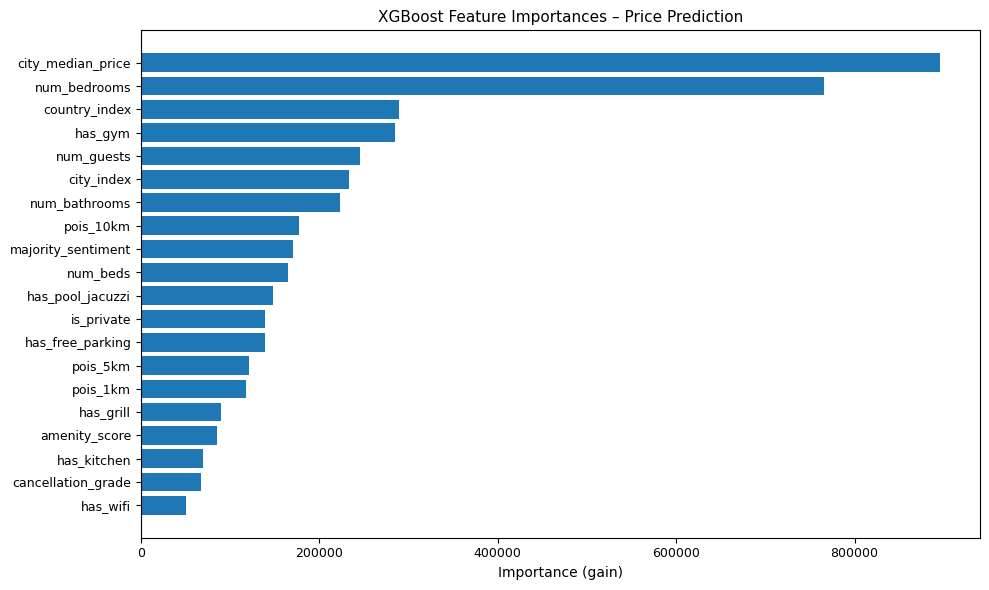

In [0]:
# XGBoost Feature Importances (Gain) + Bar Plot

# XGBoost model from the pipeline
xgb_model = model.stages[-1]

# Feature names in the exact order used by VectorAssembler
feature_columns = feature_cols  # num + binary + city_index + country_index

# Get gain-based importance from XGBoost
booster = xgb_model.get_booster()
score_dict = booster.get_score(importance_type="gain")

# Map f0, f1, ... to feature names
importances = []
for i, fname in enumerate(feature_columns):
    importances.append(score_dict.get(f"f{i}", 0.0))

# Build DataFrame
imp_df = (
    pd.DataFrame({
        "Feature": feature_columns,
        "Importance": importances
    })
    .sort_values("Importance", ascending=False)
)

display(imp_df)

# Plot top 20 features
top_k = min(20, len(imp_df))
plot_df = imp_df.head(top_k).sort_values("Importance", ascending=True)

plt.figure(figsize=(10, 6))
plt.barh(plot_df["Feature"], plot_df["Importance"])
plt.xlabel("Importance (gain)")
plt.title("XGBoost Feature Importances – Price Prediction")
plt.tight_layout()
plt.show()


In [0]:
from pyspark.sql import functions as F
from pyspark.ml.evaluation import RegressionEvaluator

# Create baseline prediction from city_median_price
predictions_with_base = predictions.withColumn(
    "predicted_price_baseline",
    F.col("city_median_price")
)

# Evaluators
eval_rmse_xgb = RegressionEvaluator(labelCol=label_col, predictionCol="predicted_price", metricName="rmse")
eval_mae_xgb  = RegressionEvaluator(labelCol=label_col, predictionCol="predicted_price", metricName="mae")
eval_r2_xgb   = RegressionEvaluator(labelCol=label_col, predictionCol="predicted_price", metricName="r2")

eval_rmse_base = RegressionEvaluator(labelCol=label_col, predictionCol="predicted_price_baseline", metricName="rmse")
eval_mae_base  = RegressionEvaluator(labelCol=label_col, predictionCol="predicted_price_baseline", metricName="mae")
eval_r2_base   = RegressionEvaluator(labelCol=label_col, predictionCol="predicted_price_baseline", metricName="r2")

# Compute metrics
rmse_xgb = eval_rmse_xgb.evaluate(predictions_with_base)
mae_xgb  = eval_mae_xgb.evaluate(predictions_with_base)
r2_xgb   = eval_r2_xgb.evaluate(predictions_with_base)

rmse_base = eval_rmse_base.evaluate(predictions_with_base)
mae_base  = eval_mae_base.evaluate(predictions_with_base)
r2_base   = eval_r2_base.evaluate(predictions_with_base)

# Print comparison
print("TEST SET COMPARISON")
print(f"XGBoost        | RMSE: {rmse_xgb:.2f} | MAE: {mae_xgb:.2f} | R2: {r2_xgb:.3f}")
print(f"City Median    | RMSE: {rmse_base:.2f} | MAE: {mae_base:.2f} | R2: {r2_base:.3f}")

display(
    predictions_with_base.select(
        "property_id", city_col, country_col,
        "price_per_night",
        "city_median_price",
        "predicted_price_baseline",
        "predicted_price"
    ).limit(30)
)

TEST SET COMPARISON
XGBoost        | RMSE: 88.12 | MAE: 61.10 | R2: 0.677
City Median    | RMSE: 143.10 | MAE: 96.58 | R2: 0.152


property_id,location_city,location_country,price_per_night,city_median_price,predicted_price_baseline,predicted_price
1005971768443250954,Madrid,Spain,128.29,124.01,124.01,150.82601928710938
1006475463646076905,Madrid,Spain,108.97,124.01,124.01,104.10015869140625
1006477132303304961,Madrid,Spain,225.74,124.01,124.01,142.90126037597656
1007801344063179895,Madrid,Spain,34.0,124.01,124.01,66.98450469970703
1008563937648776141,Madrid,Spain,234.97,124.01,124.01,166.80355834960938
1008812465889478794,Madrid,Spain,218.0,124.01,124.01,178.5889892578125
1010013717608224894,Madrid,Spain,80.38,124.01,124.01,134.2142333984375
1013905862093531834,Madrid,Spain,29.0,124.01,124.01,76.22531127929688
1017297715590826761,Madrid,Spain,141.0,124.01,124.01,153.28131103515625
1017435069619109338,Madrid,Spain,87.0,124.01,124.01,154.80810546875


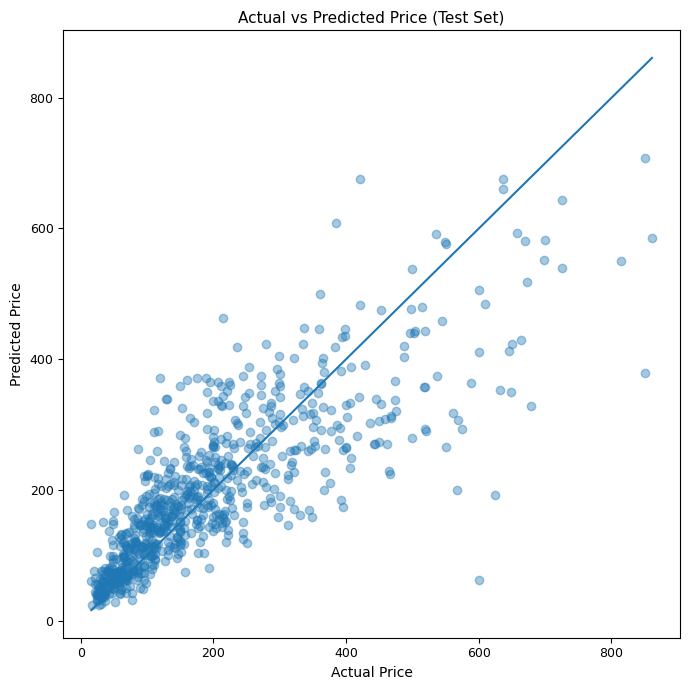

In [0]:
import pandas as pd
import matplotlib.pyplot as plt

# Take a sample for plotting (to avoid huge driver load)
plot_df = (
    predictions
    .select("price_per_night", "predicted_price")
    .sample(fraction=0.05, seed=42)   # 5% sample
    .toPandas()
)

plt.figure(figsize=(7, 7))
plt.scatter(plot_df["price_per_night"], plot_df["predicted_price"], alpha=0.4)
plt.plot(
    [plot_df["price_per_night"].min(), plot_df["price_per_night"].max()],
    [plot_df["price_per_night"].min(), plot_df["price_per_night"].max()],
)
plt.xlabel("Actual Price")
plt.ylabel("Predicted Price")
plt.title("Actual vs Predicted Price (Test Set)")
plt.tight_layout()
plt.show()

## Predict for new property

In [0]:
from pyspark.sql import functions as F
from pyspark.sql import Row

# Cancellation mapping (text -> 0/1/2)
cancellation_map = {
    "No refund": 0,
    "Partial refund": 1,
    "Full refund": 2
}

def map_cancellation_grade(text):
    return int(cancellation_map.get(text, 1))  # default = 1

amenity_cols = [
    "has_wifi", "has_ac_heating", "has_kitchen", "has_free_parking",
    "has_laundry", "has_pool_jacuzzi", "has_grill", "has_gym"
]

def prepare_new_listing_features(host_input: dict):
    # Host must provide ALL of these
    required = [
        "location_city", "location_country",
        "lat", "long",
        "cancellation_grade",
        "num_guests", "num_bedrooms", "num_beds", "num_bathrooms",
        "is_private"
    ] + amenity_cols

    missing = [k for k in required if k not in host_input]
    if missing:
        raise ValueError(f"Missing required fields: {missing}")

    city = host_input["location_city"]
    country = host_input["location_country"]

    # Ensure city exists in training data (so StringIndexer mapping exists)
    if train_df.filter(F.col(city_col) == city).limit(1).count() == 0:
        raise ValueError(f"City '{city}' not seen in training data")

    # City median price lookup (from train_df)
    city_price_row = (
        train_df
        .filter((F.col(city_col) == city) & (F.col(country_col) == country))
        .select("city_median_price")
        .limit(1)
        .collect()
    )
    if not city_price_row:
        raise ValueError(f"No city_median_price found for city='{city}', country='{country}'")

    city_median_price = float(city_price_row[0]["city_median_price"])

    # Amenity score (computed)
    amenity_score = sum(int(host_input[c]) for c in amenity_cols) / len(amenity_cols)

    # POIs (computed from your POI logic)
    pois_1km, pois_5km, pois_10km = compute_pois_for_new_listing(
        city,
        float(host_input["lat"]),
        float(host_input["long"])
    )

    # Default majority sentiment (neutral = 1)
    majority_sentiment_default = 1

    # Final feature dict (covers everything in your model)
    features = {
        "location_city": city,
        "location_country": country,

        "lat": float(host_input["lat"]),
        "long": float(host_input["long"]),

        "cancellation_grade": map_cancellation_grade(host_input["cancellation_grade"]),
        "amenity_score": float(amenity_score),
        "majority_sentiment": int(host_input.get("majority_sentiment", majority_sentiment_default)),
        "city_median_price": float(city_median_price),

        "num_guests": int(host_input["num_guests"]),
        "num_bedrooms": int(host_input["num_bedrooms"]),
        "num_beds": int(host_input["num_beds"]),
        "num_bathrooms": float(host_input["num_bathrooms"]),

        "pois_1km": float(pois_1km),
        "pois_5km": float(pois_5km),
        "pois_10km": float(pois_10km),

        "is_private": int(host_input["is_private"]),
        **{c: int(host_input[c]) for c in amenity_cols}
    }

    return features


def predict_price_for_new_listing(host_input: dict):
    features = prepare_new_listing_features(host_input)
    df = spark.createDataFrame([Row(**features)])

    # Apply same indexers + trained model
    df = country_indexer.transform(city_indexer.transform(df))
    pred = model.transform(df)

    return pred.select("predicted_price").first()[0], features


In [0]:
from pyspark.sql import Row
from pyspark.sql import functions as F

def compute_pois_for_new_listing(city: str, lat: float, lon: float):
    # single-row DF for the new listing
    new_prop = spark.createDataFrame(
        [Row(location_city=city, lat=float(lat), long=float(lon))]
    )

    joined_new = (
        new_prop.alias("p")
        .join(pois.alias("o"), on="location_city", how="left")
        .withColumn(
            "dist_km",
            haversine_km(
                F.col("p.lat"), F.col("p.long"),
                F.col("o.poi_lat"), F.col("o.poi_lon")
            )
        )
    )

    row = (
        joined_new
        .agg(
            F.sum(F.when(F.col("dist_km") <= 1, 1).otherwise(0)).alias("pois_1km"),
            F.sum(F.when(F.col("dist_km") <= 5, 1).otherwise(0)).alias("pois_5km"),
            F.sum(F.when(F.col("dist_km") <= 10, 1).otherwise(0)).alias("pois_10km"),
        )
        .collect()[0]
    )

    return int(row["pois_1km"]), int(row["pois_5km"]), int(row["pois_10km"])


In [0]:
host_input = {
    "location_city": "Rome",
    "location_country": "Italy",
    "lat": 41.922896365259064,
    "long": 12.457845531693835,
    "cancellation_grade": "Full refund",  
    "num_guests": 2,
    "num_bedrooms": 1,
    "num_beds": 1,
    "num_bathrooms": 1,
    "is_private": 0,
    "has_wifi": 1,
    "has_ac_heating": 1,
    "has_kitchen": 1,
    "has_free_parking": 0,
    "has_laundry": 0,
    "has_pool_jacuzzi": 0,
    "has_grill": 0,
    "has_gym": 0
}

pred_price, used_features = predict_price_for_new_listing(host_input)
print(f"Recommended nightly price: {pred_price:.2f}")

print("Auto-filled features:")
print("city_median_price:", used_features["city_median_price"])
print("amenity_score:", used_features["amenity_score"])
print("pois_1km/5km/10km:", used_features["pois_1km"], used_features["pois_5km"], used_features["pois_10km"])
print("majority_sentiment (default):", used_features["majority_sentiment"])

Recommended nightly price: 161.70
Auto-filled features:
city_median_price: 155.01
amenity_score: 0.375
pois_1km/5km/10km: 5.0 1255.0 1597.0
majority_sentiment (default): 1


In [0]:
print("hello")

hello


# Predict rent propability


In [0]:
filtered_df.printSchema()
weather_df.printSchema()
holidays_df.printSchema()
df_daily.printSchema()

root
 |-- property_id: string (nullable = true)
 |-- location_city: string (nullable = true)
 |-- name: string (nullable = true)
 |-- price: string (nullable = true)
 |-- image: string (nullable = true)
 |-- description: string (nullable = true)
 |-- category: string (nullable = true)
 |-- availability: string (nullable = true)
 |-- discount: string (nullable = true)
 |-- reviews: string (nullable = true)
 |-- ratings: string (nullable = true)
 |-- seller_info: string (nullable = true)
 |-- breadcrumbs: string (nullable = true)
 |-- location: string (nullable = true)
 |-- lat: string (nullable = true)
 |-- long: string (nullable = true)
 |-- guests: string (nullable = true)
 |-- pets_allowed: string (nullable = true)
 |-- description_items: array (nullable = true)
 |    |-- element: string (containsNull = true)
 |-- category_rating: string (nullable = true)
 |-- house_rules: string (nullable = true)
 |-- details: string (nullable = true)
 |-- highlights: string (nullable = true)
 |-- a

## Logistic Regression Model



In [0]:
from pyspark.ml import Pipeline
from pyspark.ml.feature import Imputer, StringIndexer, OneHotEncoder, VectorAssembler
from pyspark.ml.classification import LogisticRegression
from pyspark.ml.evaluation import BinaryClassificationEvaluator
from pyspark.ml.functions import vector_to_array
from pyspark.ml import PipelineModel

START_DATE = "2025-05-01"
END_DATE   = "2026-01-16"

def _to_double(colname):
    return F.regexp_replace(F.col(colname).cast("string"), r"[^0-9\.\-]", "").cast("double")

def _to_int(colname):
    return F.regexp_replace(F.col(colname).cast("string"), r"[^0-9]", "").cast("int")


In [0]:
def build_df_model(
    filtered_df_in,
    weather_df_in,
    holidays_df_in,
    feature_cols=("location_country","location_city","ratings","property_number_of_reviews","price_per_night", "price_ratio"),
    weather_cols=("weather_code","temperature_2m_mean"),
    start_date=START_DATE,
    end_date=END_DATE,
    label_col="label"
):
    # Weather per city+date
    w = (
        weather_df_in
        .select(
            "location_city",
            F.to_date("date").alias("date"),
            *[F.col(c).cast("double").alias(c) for c in weather_cols if c in weather_df_in.columns]
        )
        .where(
            F.col("location_city").isNotNull()
            & F.col("date").isNotNull()
            & (F.col("date") >= F.lit(start_date))
            & (F.col("date") <= F.lit(end_date))
        )
        .dropDuplicates(["location_city", "date"])
    )

    # Holidays per city+date
    h = (
        holidays_df_in
        .select(
            "location_city",
            F.to_date("date").alias("date"),
            F.col("is_national_public_holiday").cast("int").alias("is_holiday")
        )
        .where(
            F.col("location_city").isNotNull()
            & F.col("date").isNotNull()
            & (F.col("date") >= F.lit(start_date))
            & (F.col("date") <= F.lit(end_date))
        )
        .dropDuplicates(["location_city", "date"])
    )

    # Availability exploded
    avail = (
        filtered_df_in
        .select("property_id", F.explode_outer("available_dates_arr").alias("date"))
        .where(
            F.col("property_id").isNotNull()
            & F.col("date").isNotNull()
            & (F.col("date") >= F.lit(start_date))
            & (F.col("date") <= F.lit(end_date))
        )
        .dropDuplicates(["property_id", "date"])
        .withColumn("available", F.lit(1))
    )

    # Property base features
    cols_keep = ["property_id"] + [c for c in feature_cols if c in filtered_df_in.columns]
    props = (
        filtered_df_in
        .select(*cols_keep)
        .where(F.col("property_id").isNotNull())
        .dropDuplicates(["property_id"])
    )

    # Clean numeric fields
    if "ratings" in props.columns:
        props = props.withColumn("ratings", _to_double("ratings"))
    if "property_number_of_reviews" in props.columns:
        props = props.withColumn("property_number_of_reviews", _to_int("property_number_of_reviews"))
    if "price_per_night" in props.columns:
        props = props.withColumn("price_per_night", F.col("price_per_night").cast("double"))
    if "price_ratio" in props.columns:
        props = props.withColumn("price_ratio", F.col("price_ratio").cast("double"))
    if "location_city" not in props.columns:
        raise ValueError("feature_cols must include 'location_city' for joining weather/holidays.")

    # Combine + label
    df_model = (
        props.alias("p")
        .join(w.alias("w"), on=[F.col("p.location_city") == F.col("w.location_city")], how="inner")
        .select(
            F.col("p.property_id").alias("property_id"),
            F.col("w.date").alias("date"),
            *[F.col(f"p.{c}").alias(c) for c in feature_cols if c in props.columns],
            *[F.col(f"w.{c}").alias(c) for c in weather_cols if c in w.columns],
        )
        .join(h, on=["location_city", "date"], how="left")
        .withColumn("is_holiday", F.coalesce(F.col("is_holiday"), F.lit(0)))
        .join(avail.select("property_id", "date", "available"), on=["property_id", "date"], how="left")
        .withColumn("available", F.coalesce(F.col("available"), F.lit(0)))
        .withColumn(label_col, (1 - F.col("available")).cast("int"))
    )

    # Weather flags (Option 2)
    df_model = df_model.withColumn("weather_code_int", F.col("weather_code").cast("int"))

    df_model = (
        df_model
        .withColumn("is_clear",   F.col("weather_code_int").isin([0, 1, 2, 3]).cast("int"))
        .withColumn("is_fog",     F.col("weather_code_int").isin([45, 48]).cast("int"))
        .withColumn("is_drizzle", F.col("weather_code_int").isin([51, 53, 55, 56, 57]).cast("int"))
        .withColumn("is_rain",    F.col("weather_code_int").isin([61, 63, 65, 66, 67, 80, 81, 82]).cast("int"))
        .withColumn("is_snow",    F.col("weather_code_int").isin([71, 73, 75, 77, 85, 86]).cast("int"))
        .withColumn("is_storm",   F.col("weather_code_int").isin([95, 96, 99]).cast("int"))
        .drop("weather_code_int")
    )

    return df_model

In [0]:
def split_train_val_test_random(df, train=0.7, val=0.15, test=0.15, seed=42):
    if abs((train + val + test) - 1.0) > 1e-9:
        raise ValueError("train+val+test must sum to 1.0")
    return df.randomSplit([train, val, test], seed=seed)

def split_train_val_test_by_property(df, train=0.7, val=0.15, test=0.15, seed=42):
    if abs((train + val + test) - 1.0) > 1e-9:
        raise ValueError("train+val+test must sum to 1.0")

    props = df.select("property_id").distinct()
    p_train, p_val, p_test = props.randomSplit([train, val, test], seed=seed)

    train_df = df.join(p_train, on="property_id", how="inner")
    val_df   = df.join(p_val,   on="property_id", how="inner")
    test_df  = df.join(p_test,  on="property_id", how="inner")
    return train_df, val_df, test_df

def sanitize_feature_columns(df_train, num_cols, cat_cols, label_col="label", min_non_null=1):
    num_exprs = [F.sum(F.col(c).isNotNull().cast("int")).alias(c) for c in num_cols if c in df_train.columns]
    num_counts = df_train.select(*num_exprs).first().asDict() if num_exprs else {}
    num_cols_clean = [c for c in num_cols if c in df_train.columns and num_counts.get(c, 0) >= min_non_null]

    cat_exprs = [F.sum(F.col(c).isNotNull().cast("int")).alias(c) for c in cat_cols if c in df_train.columns]
    cat_counts = df_train.select(*cat_exprs).first().asDict() if cat_exprs else {}
    cat_cols_clean = [c for c in cat_cols if c in df_train.columns and cat_counts.get(c, 0) >= min_non_null]

    return num_cols_clean, cat_cols_clean


In [0]:
def build_lr_pipeline(num_cols, cat_cols, label_col="label", regParam=0.01, elasticNetParam=0.0, maxIter=200):
    imputer = Imputer(inputCols=num_cols, outputCols=[c+"_imp" for c in num_cols])

    indexers = [StringIndexer(inputCol=c, outputCol=c+"_idx", handleInvalid="keep") for c in cat_cols]
    encoder = OneHotEncoder(
        inputCols=[c+"_idx" for c in cat_cols],
        outputCols=[c+"_ohe" for c in cat_cols],
        handleInvalid="keep"
    )

    feature_cols = [c+"_imp" for c in num_cols] + [c+"_ohe" for c in cat_cols]
    assembler = VectorAssembler(inputCols=feature_cols, outputCol="features")

    lr = LogisticRegression(
        featuresCol="features",
        labelCol=label_col,
        regParam=regParam,
        elasticNetParam=elasticNetParam,
        maxIter=maxIter
    )

    return Pipeline(stages=[imputer] + indexers + [encoder, assembler, lr])

def evaluate_binary(pred_df, label_col="label"):
    evaluator_auc = BinaryClassificationEvaluator(labelCol=label_col, rawPredictionCol="rawPrediction", metricName="areaUnderROC")
    evaluator_pr  = BinaryClassificationEvaluator(labelCol=label_col, rawPredictionCol="rawPrediction", metricName="areaUnderPR")
    return {
        "auc_roc": evaluator_auc.evaluate(pred_df),
        "auc_pr": evaluator_pr.evaluate(pred_df),
    }

def train_lr_with_val_test(pipeline, train_df, val_df, test_df, label_col="label"):
    model = pipeline.fit(train_df)
    pred_val  = model.transform(val_df).withColumn("p_rented", vector_to_array("probability")[1])
    pred_test = model.transform(test_df).withColumn("p_rented", vector_to_array("probability")[1])
    metrics_val  = evaluate_binary(pred_val,  label_col=label_col)
    metrics_test = evaluate_binary(pred_test, label_col=label_col)
    return model, pred_val, pred_test, {"val": metrics_val, "test": metrics_test}

def extract_lr_weights(pipeline_model):
    lr_model = pipeline_model.stages[-1]
    assembler_model = pipeline_model.stages[-2]
    feature_names = assembler_model.getInputCols()
    coeffs = lr_model.coefficients.toArray()
    intercept = lr_model.intercept

    
    weights_df = spark.createDataFrame(
        [(int(i), feature_names[i], float(coeffs[i])) for i in range(len(feature_names))],
        ["idx", "feature_name", "weight"]
    )


    return weights_df, intercept

In [0]:

def run_logistic_model_end_to_end(
    filtered_df,
    weather_df,
    holidays_df,
    feature_cols,
    weather_cols,
    num_cols,
    cat_cols,
    start_date=START_DATE,
    end_date=END_DATE,
    split_mode="property",
    seed=42,
    regParam=0.01,
    elasticNetParam=0.0,
    maxIter=200
):
    df_model = build_df_model(
        filtered_df,
        weather_df,
        holidays_df,
        feature_cols=feature_cols,
        weather_cols=weather_cols,
        start_date=start_date,
        end_date=end_date,
        label_col="label"
    )

    if split_mode == "property":
        train_df, val_df, test_df = split_train_val_test_by_property(df_model, seed=seed)
    else:
        train_df, val_df, test_df = split_train_val_test_random(df_model, seed=seed)

    num_cols_clean, cat_cols_clean = sanitize_feature_columns(train_df, num_cols, cat_cols)

    pipeline = build_lr_pipeline(
        num_cols_clean, cat_cols_clean,
        label_col="label",
        regParam=regParam,
        elasticNetParam=elasticNetParam,
        maxIter=maxIter
    )

    model, pred_val, pred_test, metrics = train_lr_with_val_test(
        pipeline, train_df, val_df, test_df, label_col="label"
    )

    # weights_df here is the RAW weights with idx (do not reorder it)
    weights_df, intercept = extract_lr_weights(model)

    # pretty copy for display only (reordered)
    weights_pretty = (
        weights_df
        .withColumn("abs_weight", F.abs(F.col("weight")))
        .orderBy(F.desc("abs_weight"))
        .drop("abs_weight")
        .withColumn("weight", F.round(F.col("weight"), 4))
    )

    preprocess_model = PipelineModel(stages=model.stages[:-1])

    return {
        "model": model,
        "preprocess_model": preprocess_model,
        "metrics": metrics,
        "weights_raw": weights_df,     #  use for optimization
        "weights": weights_pretty,     #  for reporting
        "intercept": float(intercept),
        "pred_val": pred_val,
        "pred_test": pred_test,
        "df_model": df_model
    }


In [0]:


NUM_COLS = [
    "ratings","property_number_of_reviews","price_per_night","price_ratio","temperature_2m_mean","is_holiday",
    "is_clear","is_fog","is_drizzle","is_rain","is_snow","is_storm"
]
CAT_COLS = ["location_city","location_country"]

results_full = run_logistic_model_end_to_end(
    filtered_df=filtered_df,
    weather_df=weather_df,
    holidays_df=holidays_df,
    feature_cols=("location_country","location_city","ratings","property_number_of_reviews","price_per_night","price_ratio"),
    weather_cols=("weather_code","temperature_2m_mean"),
    num_cols=NUM_COLS,
    cat_cols=CAT_COLS,
    split_mode="property",
    seed=42
)

print("FULL metrics:", results_full["metrics"])
results_full["weights"].show(30, truncate=False)

Uploading artifacts:   0%|          | 0/4 [00:00<?, ?it/s]

🏃 View run flawless-grouse-874 at: https://adb-983293358114278.18.azuredatabricks.net/ml/experiments/110073251481556/runs/711d88e118d74e1186cfff1fbe54d0c1
🧪 View experiment at: https://adb-983293358114278.18.azuredatabricks.net/ml/experiments/110073251481556
FULL metrics: {'val': {'auc_roc': 0.6180684907367697, 'auc_pr': 0.5367028534443918}, 'test': {'auc_roc': 0.6206475620509456, 'auc_pr': 0.5361095818330666}}
+---+------------------------------+-------+
|idx|feature_name                  |weight |
+---+------------------------------+-------+
|12 |location_city_ohe             |-0.4725|
|13 |location_country_ohe          |0.3655 |
|10 |is_snow_imp                   |-0.2659|
|5  |is_holiday_imp                |0.1665 |
|0  |ratings_imp                   |0.0718 |
|9  |is_rain_imp                   |-0.0312|
|6  |is_clear_imp                  |0.0305 |
|3  |price_ratio_imp               |0.0153 |
|4  |temperature_2m_mean_imp       |0.0055 |
|8  |is_drizzle_imp                |0.0038 |


## Model Evaluation & Validation Metrics

In [0]:
import pyspark.sql.functions as F

def compute_binary_diagnostics(pred_df, threshold=0.35, eps=1e-15, label_col="label", prob_col="p_rented"):
    """
    Returns:
      - cm_df: confusion matrix grouped counts
      - metrics_dict: precision/recall/f1/accuracy + logloss + brier
      - calib_df: (optional) calibration bins table
    """

    # Clip probabilities for logloss stability
    scored = pred_df.withColumn(
        "p_clip",
        F.when(F.col(prob_col) < eps, eps)
         .when(F.col(prob_col) > 1-eps, 1-eps)
         .otherwise(F.col(prob_col))
    ).withColumn(
        "pred_label",
        (F.col(prob_col) >= F.lit(threshold)).cast("int")
    )

    # Confusion matrix
    cm_df = (
        scored
        .groupBy(label_col, "pred_label")
        .count()
        .orderBy(label_col, "pred_label")
    )

    # Aggregate counts to compute precision/recall etc.
    agg = scored.select(
        F.sum((F.col(label_col) == 1).cast("int")).alias("P"),
        F.sum((F.col(label_col) == 0).cast("int")).alias("N"),
        F.sum(((F.col(label_col) == 1) & (F.col("pred_label") == 1)).cast("int")).alias("TP"),
        F.sum(((F.col(label_col) == 0) & (F.col("pred_label") == 1)).cast("int")).alias("FP"),
        F.sum(((F.col(label_col) == 1) & (F.col("pred_label") == 0)).cast("int")).alias("FN"),
        F.sum(((F.col(label_col) == 0) & (F.col("pred_label") == 0)).cast("int")).alias("TN"),
    ).first()

    TP, FP, FN, TN = agg["TP"], agg["FP"], agg["FN"], agg["TN"]
    P, N = agg["P"], agg["N"]
    total = P + N

    precision = float(TP) / float(TP + FP) if (TP + FP) > 0 else 0.0
    recall    = float(TP) / float(TP + FN) if (TP + FN) > 0 else 0.0
    f1        = (2*precision*recall) / (precision+recall) if (precision+recall) > 0 else 0.0
    accuracy  = float(TP + TN) / float(total) if total > 0 else 0.0

    # LogLoss
    logloss = scored.select(
        F.mean(
            -(F.col(label_col)*F.log(F.col("p_clip")) + (1-F.col(label_col))*F.log(1-F.col("p_clip")))
        ).alias("logloss")
    ).first()["logloss"]

    # Brier score
    brier = scored.select(
        F.mean((F.col(prob_col) - F.col(label_col))**2).alias("brier")
    ).first()["brier"]

    metrics_dict = {
        "threshold": threshold,
        "precision": precision,
        "recall": recall,
        "f1": f1,
        "accuracy": accuracy,
        "logloss": float(logloss),
        "brier": float(brier),
        "TP": int(TP), "FP": int(FP), "FN": int(FN), "TN": int(TN),
        "total": int(total)
    }

    # Optional: calibration bins (like you already did)
    calib_df = (
        scored
        .withColumn("bin", F.ntile(6).over(
            __import__("pyspark.sql.window").sql.window.Window.orderBy(F.col(prob_col))
        ))
        .groupBy("bin")
        .agg(
            F.count("*").alias("n"),
            F.mean(prob_col).alias("avg_pred"),
            F.mean(label_col).alias("avg_actual")
        )
        .orderBy("bin")
    )

    return cm_df, metrics_dict, calib_df

In [0]:
import os
import json

def save_run_outputs(
    run_name,
    results_dict,
    base_dir="/dbfs/FileStore/airbnb_runs",
    save_pred_limit=100000
):
    """
    Saves:
    - metrics.json
    - weights.csv
    - pred_test.parquet (optionally limited)
    """

    # ---------- paths ----------
    run_dir = f"{base_dir}/{run_name}"
    os.makedirs(run_dir, exist_ok=True)   # 

    # ---------- save metrics ----------
    metrics_out = {
        "metrics": results_dict.get("metrics"),
        "intercept": float(results_dict.get("intercept", 0.0))
    }

    with open(f"{run_dir}/metrics.json", "w") as f:
        json.dump(metrics_out, f, indent=2)

    # ---------- save weights ----------
    results_dict["weights_raw"].coalesce(1).write.mode("overwrite").csv(
        f"{run_dir}/weights_csv", header=True
    )

    # ---------- save predictions ----------
    pred_df = results_dict["pred_test"]

    if save_pred_limit is not None:
        pred_df = pred_df.limit(save_pred_limit)

    pred_df.write.mode("overwrite").parquet(
        f"{run_dir}/pred_test_parquet"
    )

    print(f"Saved outputs for run '{run_name}' in {run_dir}")

In [0]:
save_run_outputs(
    run_name="full",
    results_dict=results_full,
    save_pred_limit=None
)

Saved outputs for run 'full' in /dbfs/FileStore/airbnb_runs/full


In [0]:
def compute_all_stats(results_dict, run_name="RUN", threshold=0.35, eps=1e-15, bins=6):
    pred_test = results_dict["pred_test"]
    auc_metrics = results_dict.get("metrics", {})
    intercept = results_dict.get("intercept", None)

    # sizes / distincts
    sizes_row = pred_test.select(
        F.count("*").alias("n_rows"),
        F.countDistinct("property_id").alias("n_properties"),
        F.countDistinct("date").alias("n_dates"),
        F.countDistinct("location_city").alias("n_cities"),
        F.countDistinct("location_country").alias("n_countries"),
        F.mean("label").alias("label_rate")  # % rented
    ).first()

    # scoring + predictions
    scored = (pred_test
        .withColumn(
            "p_clip",
            F.when(F.col("p_rented") < eps, eps)
             .when(F.col("p_rented") > 1-eps, 1-eps)
             .otherwise(F.col("p_rented"))
        )
        .withColumn("pred_label", (F.col("p_rented") >= F.lit(threshold)).cast("int"))
    )

    # confusion matrix
    cm_df = (
        scored
        .groupBy("label", "pred_label")
        .count()
        .orderBy("label", "pred_label")
    )

    # counts for precision/recall
    agg = scored.select(
        F.sum((F.col("label") == 1).cast("int")).alias("P"),
        F.sum((F.col("label") == 0).cast("int")).alias("N"),
        F.sum(((F.col("label") == 1) & (F.col("pred_label") == 1)).cast("int")).alias("TP"),
        F.sum(((F.col("label") == 0) & (F.col("pred_label") == 1)).cast("int")).alias("FP"),
        F.sum(((F.col("label") == 1) & (F.col("pred_label") == 0)).cast("int")).alias("FN"),
        F.sum(((F.col("label") == 0) & (F.col("pred_label") == 0)).cast("int")).alias("TN"),
    ).first()

    TP, FP, FN, TN = int(agg["TP"]), int(agg["FP"]), int(agg["FN"]), int(agg["TN"])
    P, N = int(agg["P"]), int(agg["N"])
    total = P + N

    precision = TP / (TP + FP) if (TP + FP) > 0 else 0.0
    recall    = TP / (TP + FN) if (TP + FN) > 0 else 0.0
    f1        = (2*precision*recall) / (precision+recall) if (precision+recall) > 0 else 0.0
    accuracy  = (TP + TN) / total if total > 0 else 0.0

    # logloss
    logloss = scored.select(
        F.mean(
            -(F.col("label")*F.log(F.col("p_clip")) + (1-F.col("label"))*F.log(1-F.col("p_clip")))
        ).alias("logloss")
    ).first()["logloss"]

    # brier
    brier = scored.select(
        F.mean((F.col("p_rented") - F.col("label"))**2).alias("brier")
    ).first()["brier"]

    # calibration bins
    w = Window.orderBy(F.col("p_rented"))
    calib_df = (
        scored
        .withColumn("bin", F.ntile(int(bins)).over(w))
        .groupBy("bin")
        .agg(
            F.count("*").alias("n"),
            F.mean("p_rented").alias("avg_pred"),
            F.mean("label").alias("avg_actual")
        )
        .orderBy("bin")
    )

    # print summary
    print("\n" + "="*70)
    print(f"{run_name} — ALL STATS")
    print("="*70)

    print("AUC metrics (from your training output):")
    print(json.dumps(auc_metrics, indent=2))

    print("\nDataset overview (on TEST):")
    print({
        "n_rows": int(sizes_row["n_rows"]),
        "n_properties": int(sizes_row["n_properties"]),
        "n_dates": int(sizes_row["n_dates"]),
        "n_cities": int(sizes_row["n_cities"]),
        "n_countries": int(sizes_row["n_countries"]),
        "label_rate_rented": float(sizes_row["label_rate"])
    })

    print("\nClassification metrics @ threshold =", threshold)
    print({
        "precision": precision,
        "recall": recall,
        "f1": f1,
        "accuracy": accuracy,
        "TP": TP, "FP": FP, "FN": FN, "TN": TN
    })

    print("\nProbability metrics:")
    print({
        "logloss": float(logloss),
        "brier": float(brier),
        "intercept": float(intercept) if intercept is not None else None
    })

    print("\nConfusion matrix table:")
    cm_df.show(truncate=False)

    print("\nCalibration bins table:")
    calib_df.show(truncate=False)

    return {
        "run_name": run_name,
        "auc_metrics": auc_metrics,
        "dataset_overview": {
            "n_rows": int(sizes_row["n_rows"]),
            "n_properties": int(sizes_row["n_properties"]),
            "n_dates": int(sizes_row["n_dates"]),
            "n_cities": int(sizes_row["n_cities"]),
            "n_countries": int(sizes_row["n_countries"]),
            "label_rate_rented": float(sizes_row["label_rate"])
        },
        "classification_metrics": {
            "threshold": threshold,
            "precision": precision,
            "recall": recall,
            "f1": f1,
            "accuracy": accuracy,
            "TP": TP, "FP": FP, "FN": FN, "TN": TN
        },
        "probability_metrics": {
            "logloss": float(logloss),
            "brier": float(brier),
            "intercept": float(intercept) if intercept is not None else None
        },
        "confusion_matrix_df": cm_df,
        "calibration_df": calib_df
    }


In [0]:
stats_full = compute_all_stats(results_full, run_name="FULL", threshold=0.35, bins=6)



FULL — ALL STATS
AUC metrics (from your training output):
{
  "val": {
    "auc_roc": 0.6180684907367697,
    "auc_pr": 0.5367028534443918
  },
  "test": {
    "auc_roc": 0.6206475620509456,
    "auc_pr": 0.5361095818330666
  }
}

Dataset overview (on TEST):
{'n_rows': 2702916, 'n_properties': 10356, 'n_dates': 261, 'n_cities': 20, 'n_countries': 10, 'label_rate_rented': 0.4198180779572876}

Classification metrics @ threshold = 0.35
{'precision': 0.4648905634874361, 'recall': 0.8403215371076665, 'f1': 0.5986116014684416, 'accuracy': 0.5233664956472363, 'TP': 952028, 'FP': 1095826, 'FN': 180905, 'TN': 449884}

Probability metrics:
{'logloss': 0.6592003678847771, 'brier': 0.23345023676611204, 'intercept': -0.7270855811877535}

Confusion matrix table:
+-----+----------+-------+
|label|pred_label|count  |
+-----+----------+-------+
|0    |0         |449519 |
|0    |1         |1096191|
|1    |0         |180851 |
|1    |1         |952082 |
+-----+----------+-------+


Calibration bins table

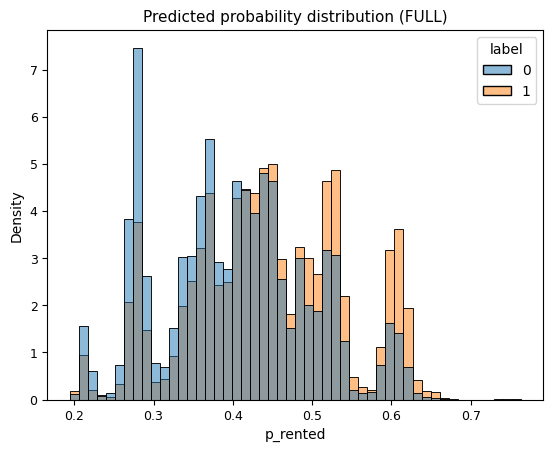

In [0]:
pdf = results_full["pred_test"] \
    .select("p_rented", "label") \
    .sample(fraction=0.02, seed=42) \
    .toPandas()

sns.histplot(
    data=pdf,
    x="p_rented",
    hue="label",
    bins=50,
    stat="density",
    common_norm=False
)
plt.title("Predicted probability distribution (FULL)")
plt.show()


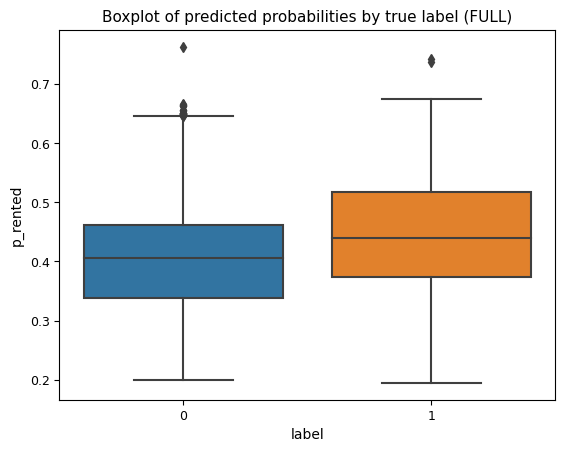

In [0]:
sns.boxplot(
    data=pdf,
    x="label",
    y="p_rented"
)
plt.title("Boxplot of predicted probabilities by true label (FULL)")
plt.show()


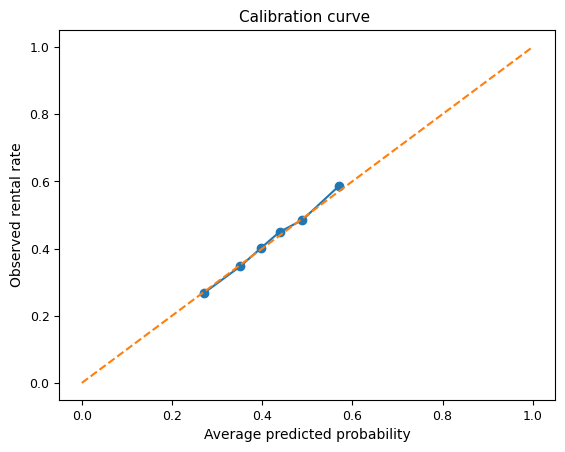

In [0]:
calib_pdf = stats_full["calibration_df"].toPandas()

plt.plot(calib_pdf["avg_pred"], calib_pdf["avg_actual"], marker="o")
plt.plot([0,1],[0,1], linestyle="--")
plt.xlabel("Average predicted probability")
plt.ylabel("Observed rental rate")
plt.title("Calibration curve ")
plt.show()

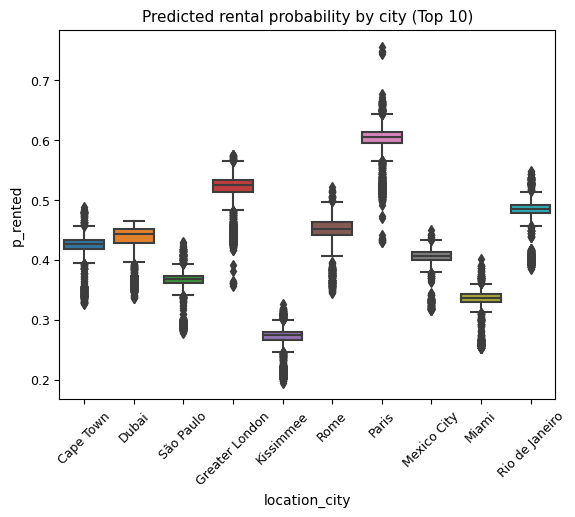

In [0]:
top_cities = (
    results_full["pred_test"]
    .groupBy("location_city")
    .count()
    .orderBy(F.desc("count"))
    .limit(10)
)

pdf_city = (
    results_full["pred_test"]
    .join(top_cities, on="location_city")
    .select("location_city", "p_rented")
    .sample(0.02)
    .toPandas()
)

sns.boxplot(
    data=pdf_city,
    x="location_city",
    y="p_rented"
)
plt.xticks(rotation=45)
plt.title("Predicted rental probability by city (Top 10)")
plt.show()

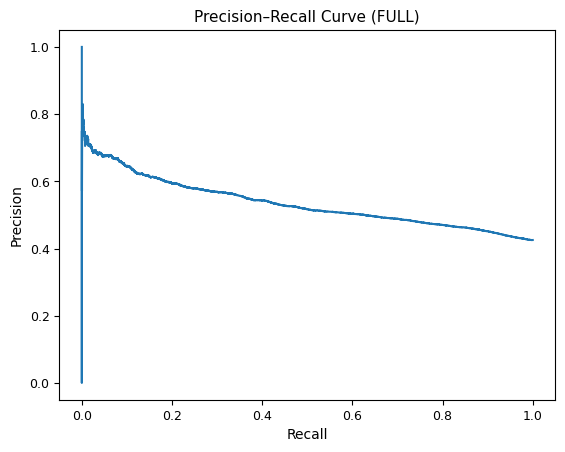

In [0]:
from sklearn.metrics import precision_recall_curve

y_true = pdf["label"]
y_score = pdf["p_rented"]

precision, recall, _ = precision_recall_curve(y_true, y_score)

plt.plot(recall, precision)
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("Precision–Recall Curve (FULL)")
plt.show()

In [0]:
display(results_full["weights"])

idx,feature_name,weight
12,location_city_ohe,-0.4725
13,location_country_ohe,0.3655
10,is_snow_imp,-0.2659
5,is_holiday_imp,0.1665
0,ratings_imp,0.0718
9,is_rain_imp,-0.0312
6,is_clear_imp,0.0305
3,price_ratio_imp,0.0153
4,temperature_2m_mean_imp,0.0055
8,is_drizzle_imp,0.0038


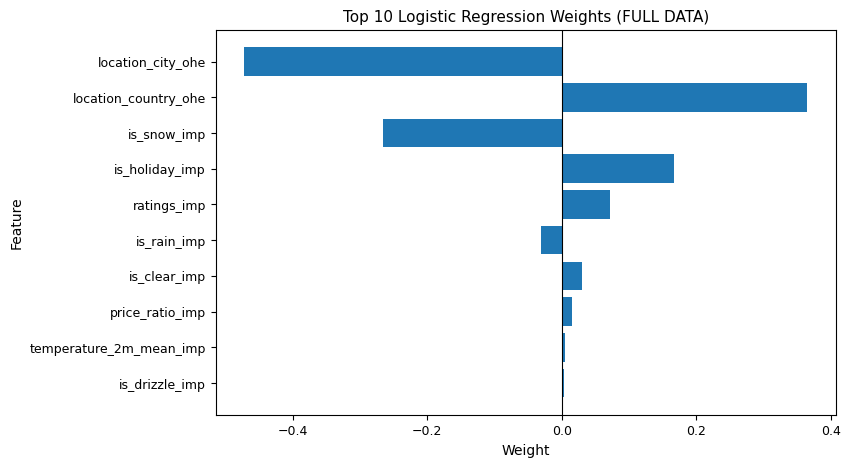

In [0]:
weights_pdf = (
    results_full["weights"]
    .orderBy(F.desc(F.abs(F.col("weight"))))
    .limit(10)
    .toPandas()
)

plt.figure(figsize=(8,5))
plt.barh(
    weights_pdf["feature_name"],
    weights_pdf["weight"]
)
plt.axvline(0, color="black", linewidth=0.8)
plt.title("Top 10 Logistic Regression Weights (FULL DATA)")
plt.xlabel("Weight")
plt.ylabel("Feature")
plt.gca().invert_yaxis()
plt.show()

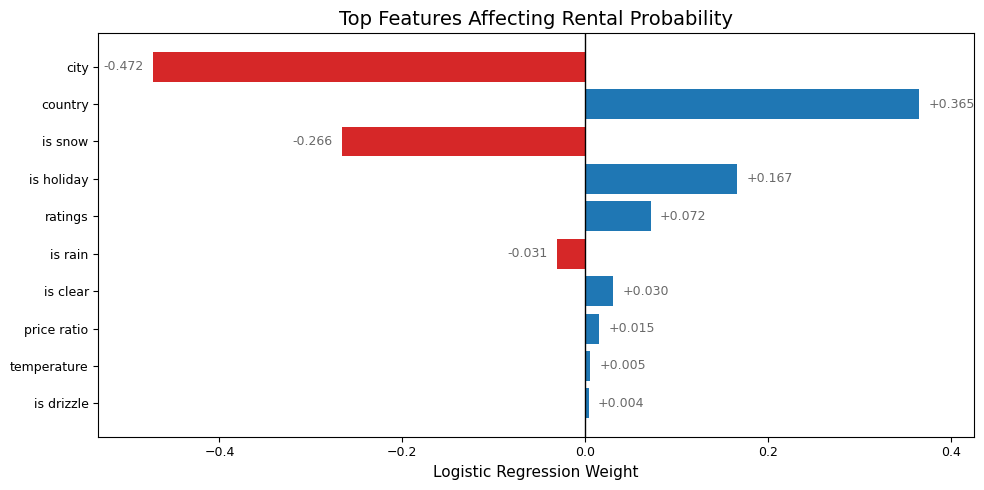

              feature_name feature_pretty  weight
0        location_city_ohe           city -0.4725
1     location_country_ohe        country  0.3655
2              is_snow_imp        is snow -0.2659
3           is_holiday_imp     is holiday  0.1665
4              ratings_imp        ratings  0.0718
5              is_rain_imp        is rain -0.0312
6             is_clear_imp       is clear  0.0305
7          price_ratio_imp    price ratio  0.0153
8  temperature_2m_mean_imp    temperature  0.0055
9           is_drizzle_imp     is drizzle  0.0038


In [0]:
weights_pdf = (
    results_full["weights"]
    .orderBy(F.desc(F.abs(F.col("weight"))))
    .limit(10)
    .toPandas()
)

def prettify_feature_name(name: str) -> str:
    name = name.replace("_imp", "")
    name = name.replace("_ohe", "")
    name = name.replace("temperature_2m_mean", "temperature")
    name = name.replace("property_number_of_reviews", "#reviews")
    name = name.replace("price_per_night", "price")
    name = name.replace("location_city", "city")
    name = name.replace("location_country", "country")
    name = name.replace("_", " ")
    return name

weights_pdf["feature_pretty"] = weights_pdf["feature_name"].apply(prettify_feature_name)

# Colors
colors = ["#1f77b4" if w > 0 else "#d62728" for w in weights_pdf["weight"]]

# Plot
fig, ax = plt.subplots(figsize=(10, 5))

y = np.arange(len(weights_pdf))
ax.barh(y, weights_pdf["weight"], color=colors)

ax.axvline(0, color="black", linewidth=1)

# y labels
ax.set_yticks(y)
ax.set_yticklabels(weights_pdf["feature_pretty"])

# keep same order as table: biggest abs on top
ax.invert_yaxis()

ax.set_title("Top Features Affecting Rental Probability", fontsize=14)
ax.set_xlabel("Logistic Regression Weight", fontsize=11)
ax.set_ylabel("")

# Fix x-limits so text never gets cut
min_w = float(weights_pdf["weight"].min())
max_w = float(weights_pdf["weight"].max())
pad = 0.06  # extra space left/right
ax.set_xlim(min_w - pad, max_w + pad)

# Value labels
for i, w in enumerate(weights_pdf["weight"]):
    if w >= 0:
        x_text = w + 0.01
        ha = "left"
    else:
        x_text = w - 0.01
        ha = "right"

    ax.text(
        x_text, i,
        f"{w:+.3f}",
        va="center",
        ha=ha,
        fontsize=9,
        color="dimgray"
    )

plt.tight_layout()
plt.show()

print(weights_pdf[["feature_name", "feature_pretty", "weight"]])


# Maximum Revenue Optimization - Not Good 

In [0]:
city_median_by_property = (
    filtered_df
    .select("property_id", "city_median_price")
    .where(F.col("property_id").isNotNull())
    .dropDuplicates(["property_id"])
)

In [0]:
df_model_with_city_median = (
    results_full["df_model"]
    .join(city_median_by_property, on="property_id", how="left")
)

In [0]:
from pyspark.sql import functions as F
from pyspark.sql.window import Window
from pyspark.ml.functions import vector_to_array

PRICE_MULTS = [0.95, 0.98, 1.0, 1.02, 1.04]

def optimize_dynamic_pricing_with_joined_ratio(
    df_model,
    full_model,
    price_col="price_per_night",
    city_median_col="city_median_price",
    multipliers=PRICE_MULTS
):
    mult_df = spark.createDataFrame(
        [(float(m),) for m in multipliers],
        ["price_multiplier"]
    )

    df_cand = (
        df_model
        .drop("label")
        .crossJoin(mult_df)
        .withColumn("baseline_price", F.col(price_col))
        .withColumn("candidate_price", F.col(price_col) * F.col("price_multiplier"))
        .withColumn(
            "price_ratio",
            F.when(F.col(city_median_col) > 0,
                   F.col("candidate_price") / F.col(city_median_col))
             .otherwise(F.lit(None).cast("double"))
        )
        .drop(price_col)
        .withColumnRenamed("candidate_price", price_col)
    )

    scored = (
        full_model.transform(df_cand)
        .withColumn("p_rented", vector_to_array("probability")[1])
        .withColumn("expected_revenue", F.col(price_col) * F.col("p_rented"))
    )

    w = Window.partitionBy("property_id", "date").orderBy(F.desc("expected_revenue"))

    optimal_prices = (
        scored
        .withColumn("rn", F.row_number().over(w))
        .where(F.col("rn") == 1)
        .select(
            "property_id",
            "date",
            "baseline_price",
            F.col(price_col).alias("optimal_price"),
            "price_ratio",
            "price_multiplier",
            "p_rented",
            "expected_revenue"
        )
    )

    return optimal_prices, scored

In [0]:
optimal_prices, grid_scored = optimize_dynamic_pricing_with_joined_ratio(
    df_model=df_model_with_city_median,
    full_model=results_full["model"]
)

optimal_prices.show(20, truncate=False)



+-------------------+----------+--------------+------------------+------------------+----------------+-------------------+------------------+
|property_id        |date      |baseline_price|optimal_price     |price_ratio       |price_multiplier|p_rented           |expected_revenue  |
+-------------------+----------+--------------+------------------+------------------+----------------+-------------------+------------------+
|1000008681751739643|2025-08-23|66.51         |69.1704           |1.6161308411214954|1.04            |0.38486328073904963|26.621147074032358|
|1000008681751739643|2025-12-05|66.51         |69.1704           |1.6161308411214954|1.04            |0.37860563828116056|26.18830344216319 |
|1000008681751739643|2025-12-22|66.51         |69.1704           |1.6161308411214954|1.04            |0.3801150937147266 |26.29271307828513 |
|1000031916459864932|2025-05-11|423.51        |440.4504          |2.198075656253119 |1.04            |0.5991928556672852 |263.91473295579806|
|10000

In [0]:
optimal_prices.filter(optimal_prices.property_id == "1000061727328639259").show(200, truncate=False)

+-------------------+----------+--------------+------------------+-----------------+----------------+-------------------+------------------+
|property_id        |date      |baseline_price|optimal_price     |price_ratio      |price_multiplier|p_rented           |expected_revenue  |
+-------------------+----------+--------------+------------------+-----------------+----------------+-------------------+------------------+
|1000061727328639259|2025-05-01|96.43         |100.28720000000001|1.496823880597015|1.04            |0.5262431681720087 |52.775453855099876|
|1000061727328639259|2025-05-02|96.43         |100.28720000000001|1.496823880597015|1.04            |0.4847747929520235 |48.61670661573818 |
|1000061727328639259|2025-05-03|96.43         |100.28720000000001|1.496823880597015|1.04            |0.4914539033526145 |49.28653589630433 |
|1000061727328639259|2025-05-04|96.43         |100.28720000000001|1.496823880597015|1.04            |0.49131584853019483|49.27269076471736 |
|100006172732

#NEW - rule_based_dynamic_pricing

In [0]:
from pyspark.sql import functions as F
from pyspark.sql.window import Window
from pyspark.ml.functions import vector_to_array

def rule_based_dynamic_pricing(
    df_model,
    full_model,
    price_col="price_per_night",
    top_quantile=0.8,     # top 20% = >= 0.8 quantile
    bottom_quantile=0.2,  # bottom 20% = <= 0.2 quantile
    up_pct=0.10,
    down_pct=0.10
):
    # Score with the original price
    scored = (
        full_model.transform(df_model)
        .withColumn("p_rented", vector_to_array("probability")[1])
        .withColumn("baseline_price", F.col(price_col))
    )

    # Rank days per property by predicted demand
    w = Window.partitionBy("property_id").orderBy(F.col("p_rented"))
    scored = scored.withColumn("p_rank", F.percent_rank().over(w))

    # Apply rule: top days up, bottom days down
    scored = scored.withColumn(
        "dynamic_price",
        F.when(F.col("p_rank") >= F.lit(top_quantile),  F.col("baseline_price") * F.lit(1 + up_pct))
         .when(F.col("p_rank") <= F.lit(bottom_quantile), F.col("baseline_price") * F.lit(1 - down_pct))
         .otherwise(F.col("baseline_price"))
    )

    # round prices
    scored = scored.withColumn("dynamic_price", F.round("dynamic_price", 2))

    # Output compact table
    out = scored.select(
        "property_id",
        "date",
        "baseline_price",
        "p_rented",
        "p_rank",
        "dynamic_price"
    )

    return out

In [0]:
dynamic_prices = rule_based_dynamic_pricing(
    df_model=results_full["df_model"],
    full_model=results_full["model"],
    top_quantile=0.8,
    bottom_quantile=0.2,
    up_pct=0.10,
    down_pct=0.10
)
dynamic_prices.show(20, truncate=False)


+-------------------+----------+--------------+-------------------+---------------------+-------------+
|property_id        |date      |baseline_price|p_rented           |p_rank               |dynamic_price|
+-------------------+----------+--------------+-------------------+---------------------+-------------+
|1000061727328639259|2025-07-02|96.43         |0.47114602938317696|0.0                  |86.79        |
|1000061727328639259|2025-08-09|96.43         |0.47155895683431137|0.0038461538461538464|86.79        |
|1000061727328639259|2025-10-19|96.43         |0.4725226046255583 |0.007692307692307693 |86.79        |
|1000061727328639259|2025-07-25|96.43         |0.4729356596431369 |0.011538461538461539 |86.79        |
|1000061727328639259|2025-10-31|96.43         |0.4733487517131294 |0.015384615384615385 |86.79        |
|1000061727328639259|2025-10-10|96.43         |0.47362416673346375|0.019230769230769232 |86.79        |
|1000061727328639259|2025-07-01|96.43         |0.474175044760975

In [0]:
pid = "1000008681751739643"

(dynamic_prices
 .where(F.col("property_id") == pid)
 .orderBy("date")
 .show(50, truncate=False)
)

+-------------------+----------+--------------+-------------------+---------------------+-------------+
|property_id        |date      |baseline_price|p_rented           |p_rank               |dynamic_price|
+-------------------+----------+--------------+-------------------+---------------------+-------------+
|1000008681751739643|2025-05-01|66.51         |0.41299832152561167|0.9884615384615385   |73.16        |
|1000008681751739643|2025-05-02|66.51         |0.3745838508182937 |0.6807692307692308   |66.51        |
|1000008681751739643|2025-05-03|66.51         |0.37523111095270445|0.7115384615384616   |66.51        |
|1000008681751739643|2025-05-04|66.51         |0.37561968136039536|0.75                 |66.51        |
|1000008681751739643|2025-05-05|66.51         |0.37561968136039536|0.75                 |66.51        |
|1000008681751739643|2025-05-06|66.51         |0.3765269679505825 |0.7923076923076923   |66.51        |
|1000008681751739643|2025-05-07|66.51         |0.378474065008254

In [0]:
import pyspark.sql.functions as F

N_PROPS = 3

random_props = (
    dynamic_prices
    .groupBy("property_id")
    .count()
    .where(F.col("count") >= 10)  
    .orderBy(F.rand())
    .limit(N_PROPS)
    .select("property_id")
    .toPandas()["property_id"]
    .tolist()
)

random_props


['48674805', '29097051', '902147930245494944']

In [0]:
import pandas as pd

plot_df = (
    dynamic_prices
    .where(F.col("property_id").isin(random_props))
    .select(
        "property_id",
        "date",
        "baseline_price",
        "dynamic_price"
    )
    .orderBy("property_id", "date")
    .toPandas()
)

plot_df["date"] = pd.to_datetime(plot_df["date"])

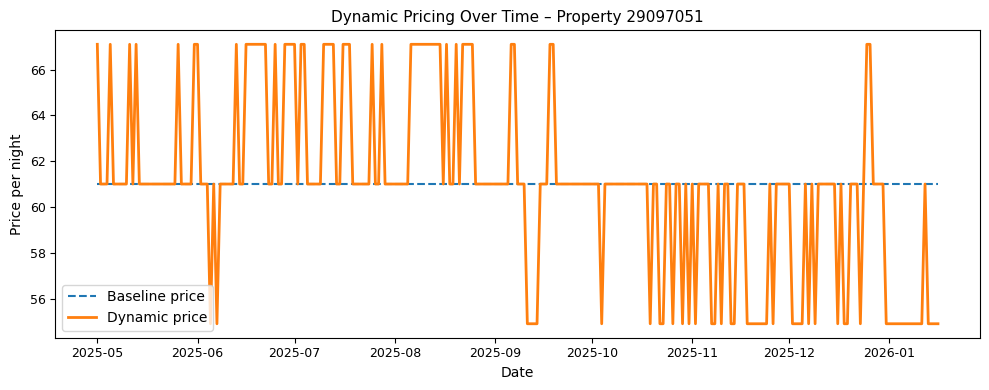

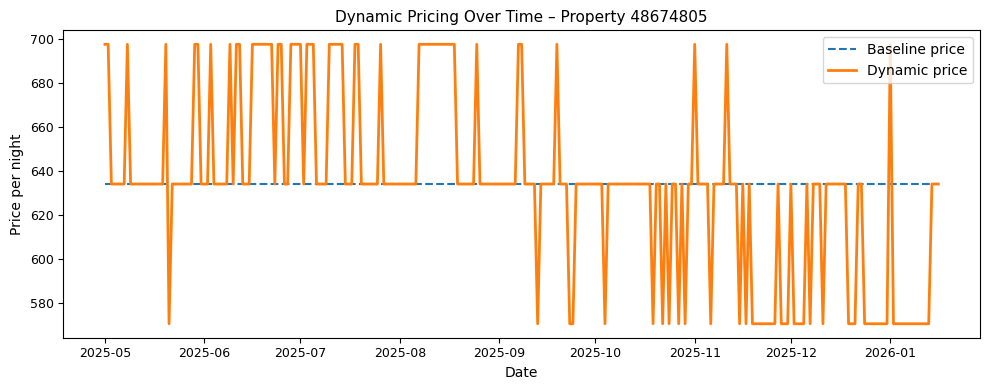

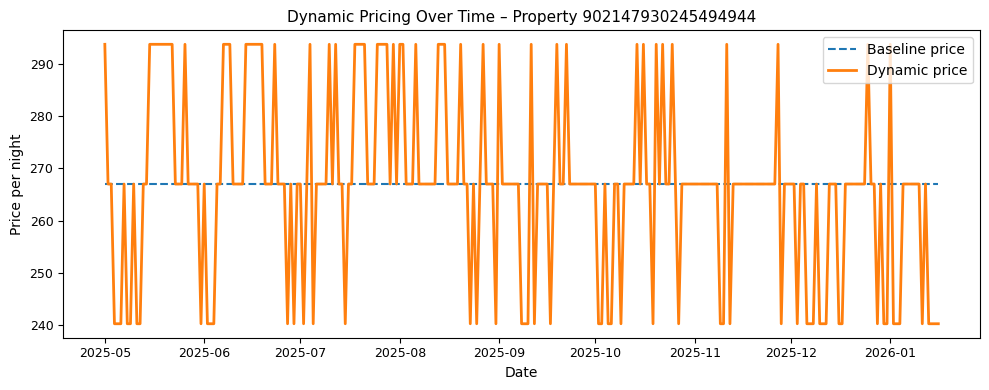

In [0]:
import matplotlib.pyplot as plt

for pid in plot_df["property_id"].unique():
    df_p = plot_df[plot_df["property_id"] == pid]

    plt.figure(figsize=(10, 4))
    plt.plot(df_p["date"], df_p["baseline_price"],
             label="Baseline price", linestyle="--")
    plt.plot(df_p["date"], df_p["dynamic_price"],
             label="Dynamic price", linewidth=2)

    plt.title(f"Dynamic Pricing Over Time – Property {pid}")
    plt.xlabel("Date")
    plt.ylabel("Price per night")
    plt.legend()
    plt.tight_layout()
    plt.show()

In [0]:
from pyspark.sql import functions as F

revenue_df = (
    dynamic_prices
    .withColumn(
        "expected_revenue_baseline",
        F.col("baseline_price") * F.col("p_rented")
    )
    .withColumn(
        "expected_revenue_dynamic",
        F.col("dynamic_price") * F.col("p_rented")
    )
    .withColumn(
        "revenue_uplift",
        F.col("expected_revenue_dynamic") - F.col("expected_revenue_baseline")
    )
)

In [0]:
summary_total = revenue_df.agg(
    F.sum("expected_revenue_baseline").alias("baseline_total_revenue"),
    F.sum("expected_revenue_dynamic").alias("dynamic_total_revenue"),
    F.sum("revenue_uplift").alias("total_uplift"),
    (F.sum("revenue_uplift") / F.sum("expected_revenue_baseline")).alias("uplift_pct")
)

summary_total.show(truncate=False)

+----------------------+---------------------+-----------------+---------------------+
|baseline_total_revenue|dynamic_total_revenue|total_uplift     |uplift_pct           |
+----------------------+---------------------+-----------------+---------------------+
|1.46835665702943E9    |1.4702894926089642E9 |1932835.579628277|0.0013163256831201452|
+----------------------+---------------------+-----------------+---------------------+



In [0]:
summary_by_property = (
    revenue_df
    .groupBy("property_id")
    .agg(
        F.sum("expected_revenue_baseline").alias("baseline_rev"),
        F.sum("expected_revenue_dynamic").alias("dynamic_rev"),
        F.sum("revenue_uplift").alias("uplift")
    )
    .withColumn("uplift_pct", F.col("uplift") / F.col("baseline_rev"))
    .orderBy(F.desc("uplift"))
)

summary_by_property.show(10, truncate=False)

+-------------------+------------------+------------------+------------------+---------------------+
|property_id        |baseline_rev      |dynamic_rev       |uplift            |uplift_pct           |
+-------------------+------------------+------------------+------------------+---------------------+
|27733673           |104679.92835137664|105073.00134477069|393.07299339410247|0.0037549986858481945|
|1234762970028591547|103490.54733292051|103883.1963605923 |392.64902767166444|0.0037940569239482817|
|48285858           |104031.04563392869|104422.12439528495|391.0787613562692 |0.0037592505100104727|
|39173764           |103028.17166886467|103415.75757234884|387.58590348421995|0.0037619410031843672|
|1362501654404136472|88159.72328160833 |88544.70770480768 |384.9844231992476 |0.004366896910162627 |
|1002270482954190553|102108.44348150764|102492.6527506812 |384.2092691736205 |0.0037627570852473407|
|765188516293357163 |96255.26673662437 |96616.60961609364 |361.34287946918585|0.00375400631

In [0]:
summary_by_property.where(F.col("uplift") < 0).count()

3218

In [0]:
revenue_df.select(
    F.mean((F.col("dynamic_price") != F.col("baseline_price")).cast("int"))
    .alias("share_of_days_with_price_change")
).show()

+-------------------------------+
|share_of_days_with_price_change|
+-------------------------------+
|            0.40737710785127007|
+-------------------------------+



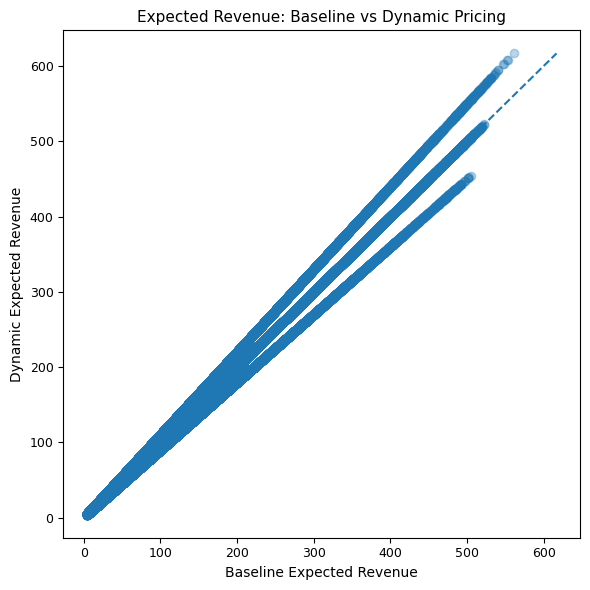

In [0]:
import matplotlib.pyplot as plt

pdf = revenue_df.select(
    "expected_revenue_baseline",
    "expected_revenue_dynamic"
).sample(fraction=0.05, seed=42).toPandas()

plt.figure(figsize=(6, 6))
plt.scatter(
    pdf["expected_revenue_baseline"],
    pdf["expected_revenue_dynamic"],
    alpha=0.3
)
plt.plot(
    [pdf.min().min(), pdf.max().max()],
    [pdf.min().min(), pdf.max().max()],
    linestyle="--"
)
plt.xlabel("Baseline Expected Revenue")
plt.ylabel("Dynamic Expected Revenue")
plt.title("Expected Revenue: Baseline vs Dynamic Pricing")
plt.tight_layout()
plt.show()